# Rainfall Weather Forecasting Project

In [2]:
#Importing required Libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import scipy as stats
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import joblib
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import power_transform
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,ConfusionMatrixDisplay
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [4]:
#Reading Dataset From Local Machine

df = pd.read_csv("rainfall.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# EDA(Exploratory Data Analysis)


In [5]:
df.shape

(8425, 23)

there are 8425 rows and 23 columns present in datset

In [6]:
# checking duplicate values in the dataset

df.duplicated().sum()

1663

there are 1663 Duplicates present in dataset

In [7]:
# Dropping Duplicate values

df.drop_duplicates(inplace=True)

In [8]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [9]:
#Here I am Seeing how many types of features are present in my dataset


# Saperating Numerical Discreate Contineous  And Categorical columns

numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_feature=[feature for feature in numerical_feature if len(df[feature].unique())<25]
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
categorical_feature = [feature for feature in df.columns if feature not in numerical_feature]
print("Numerical Features Count {}".format(len(numerical_feature)))
print("Discrete feature Count {}".format(len(discrete_feature)))
print("Continuous feature Count {}".format(len(continuous_feature)))
print("Categorical feature Count {}".format(len(categorical_feature)))

Numerical Features Count 16
Discrete feature Count 2
Continuous feature Count 14
Categorical feature Count 7


In [10]:
# checking null values in the dataset

df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

Observation:
    
Missing Data Percentage:

Dataset contains missing values represented as a percentage of total rows.
Columns with Low Missing Values:

MinTemp and MaxTemp have low missing values, approximately 1.04% and 0.84%.
Columns with Moderate Missing Values:

Rainfall, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Temp9am, Temp3pm, RainToday, and RainTomorrow have missing values ranging from approximately 0.75% to 2.04%.
Columns with High Missing Values:

Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, Pressure9am, Pressure3pm, Cloud9am, and Cloud3pm have significant missing data, ranging from approximately 11.74% to 47.86%.
Imputation Consideration:

Depending on column importance, consider imputation strategies (e.g., mean, median, or regression) for handling missing data.
Data Integrity:

Assess impact of missing data on analysis quality and integrity; consider how missing values may affect interpretation.
Further Data Exploration:

Explore relationships between missing data in different columns, identifying potential patterns or dependencies.
Data Preparation:

Decide on strategy for handling missing data (imputation, removal, or domain-specific approaches) before analysis or modeling.
Adaptation:

Tailor observations and actions to specific analysis goals and domain knowledge.
Crucial Preprocessing:

Dealing with missing data is crucial for ensuring accuracy and reliability in analysis.

**Filling Null values**

In [11]:
# this function is designed to fill missing values in a specific variable of a DataFrame with randomly selected values from the same variable, ensuring that the replacement values are aligned with the missing entries.

def randomsampleimputation(df, variable):
    df[variable]=df[variable]
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample

In [12]:
# Filling Theses columns null values by random sample imputation

randomsampleimputation(df, "Cloud9am")
randomsampleimputation(df, "Cloud3pm")
randomsampleimputation(df, "Evaporation")
randomsampleimputation(df, "Sunshine")

In [13]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.2,3.8,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,8.0,9.9,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,2.0,5.8,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,2.8,10.1,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,1.2,9.5,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [14]:
# Filing Null values of contineous features by median technique
for feature in continuous_feature:
    if(df[feature].isnull().sum()*100/len(df))>0:
        df[feature] = df[feature].fillna(df[feature].median())

In [15]:
df.isnull().sum()

Date               0
Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      942
WindGustSpeed      0
WindDir9am       794
WindDir3pm       294
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        138
RainTomorrow     138
dtype: int64

In [16]:
discrete_feature

['Cloud9am', 'Cloud3pm']

In [17]:
# Filling null values of discreate features by mode technique

def mode_nan(df,variable):
    mode=df[variable].value_counts().index[0]
    df[variable].fillna(mode,inplace=True)
mode_nan(df,"Cloud9am")
mode_nan(df,"Cloud3pm")

In [18]:
# Filling null values of categorical columns  by pandas getdummies technique

df["RainToday"] = pd.get_dummies(df["RainToday"], drop_first = True)
df["RainTomorrow"] = pd.get_dummies(df["RainTomorrow"], drop_first = True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.2,3.8,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,8.0,9.9,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,2.0,5.8,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,2.8,10.1,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,1.2,9.5,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,7.6,9.9,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0
8421,2017-06-22,Uluru,3.6,25.3,0.0,9.4,12.1,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0
8422,2017-06-23,Uluru,5.4,26.9,0.0,2.4,6.7,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0
8423,2017-06-24,Uluru,7.8,27.0,0.0,4.0,0.0,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0


In [19]:
for feature in categorical_feature:
    print(feature, (df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2016-04-30', '2017-03-04', '2015-11-03', '2017-02-27', '2017-02-28',
       '2017-03-01', '2017-03-02', '2017-03-03', '2013-04-12', '2015-04-29',
       ...
       '2013-01-11', '2013-01-10', '2013-01-09', '2013-01-08', '2013-01-07',
       '2013-01-05', '2013-01-04', '2013-01-03', '2013-01-02', '2017-06-25'],
      dtype='object', name='Date', length=3004)
Location Index(['CoffsHarbour', 'Wollongong', 'Melbourne', 'Williamtown', 'Newcastle',
       'Penrith', 'Brisbane', 'Adelaide', 'Albury', 'PerthAirport', 'Darwin',
       'Uluru'],
      dtype='object', name='Location')
WindGustDir Index(['NW', 'NNW', 'N', 'WNW', 'SSW', 'S', 'WSW', 'SW', 'SSE', 'NNE', 'NE',
       'SE', 'ESE', 'W', 'ENE', 'E'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['N', 'WNW', 'SW', 'NNE', 'NNW', 'W', 'SSW', 'WSW', 'ESE', 'NW', 'NE',
       'S', 'SSE', 'SE', 'ENE', 'E'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['NNW', 'SSW', 'N', 'NW', 'S', 'WNW', 'SE', 'NNE', 'E

This code iterates through each categorical feature in the categorical_feature list and prints the feature name along with the sorted indices of the unique values in that feature based on the mean of the "RainTomorrow" column in descending order.

In [20]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
df["WindGustDir"] = df["WindGustDir"].map(windgustdir)
df["WindDir9am"] = df["WindDir9am"].map(winddir9am)
df["WindDir3pm"] = df["WindDir3pm"].map(winddir3pm)

This code converts categorical wind direction values in three columns ("WindGustDir," "WindDir9am," and "WindDir3pm") of the DataFrame df into numerical values using predefined dictionaries.


In [21]:
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].value_counts().index[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].value_counts().index[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].value_counts().index[0])

This code fills missing values in the "WindGustDir," "WindDir9am," and "WindDir3pm" columns of the DataFrame df with the most frequent (mode) value in each respective column

In [22]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

Now i have filled all the null values



**Checking Correlation**

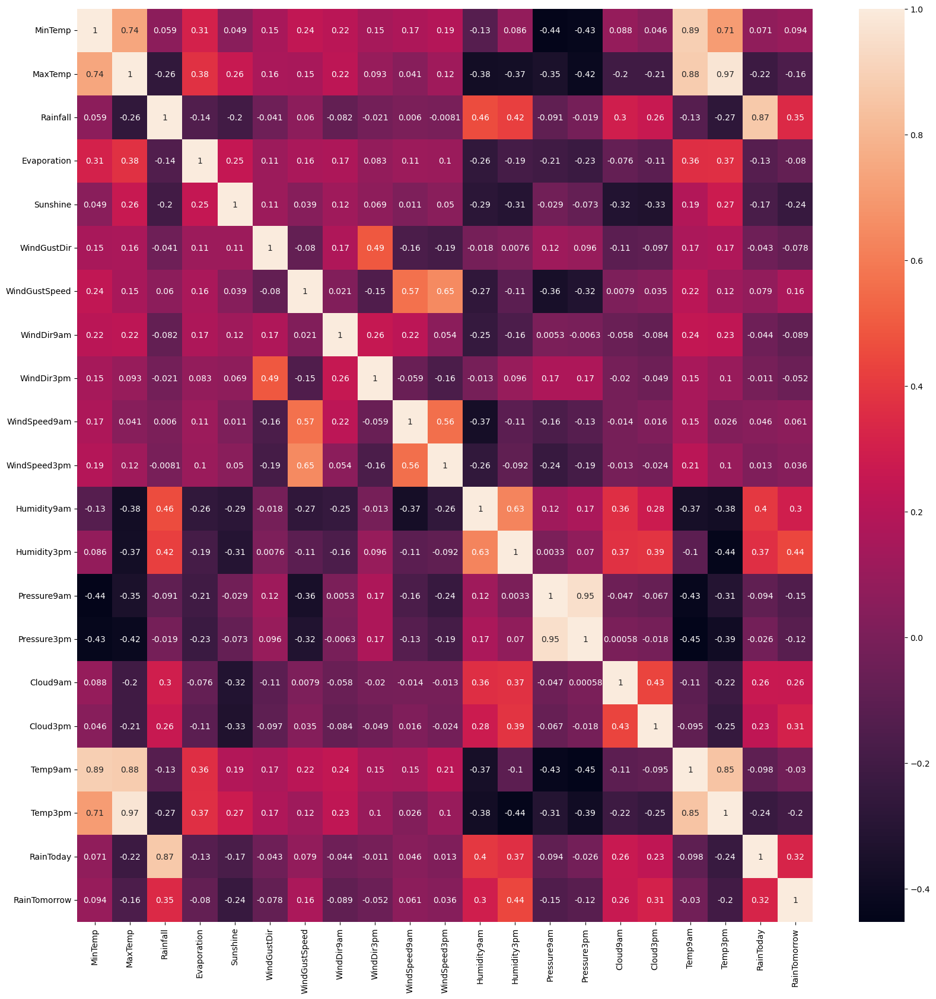

In [23]:
corrmat = df.corr(method = "spearman")
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

Observation:

Here some of the columns have very high correlation with each other

**Checking Distribution of contineous_features**


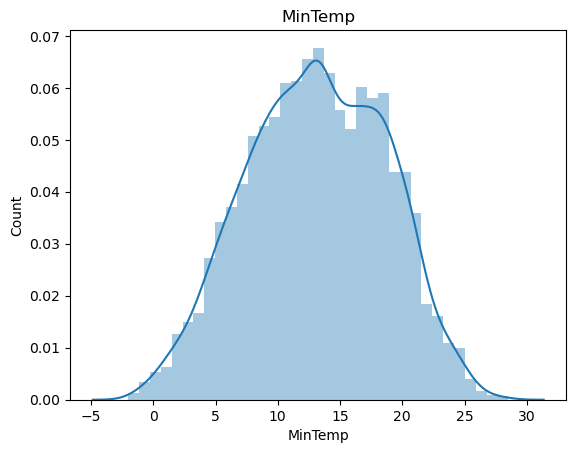

<Figure size 1500x1500 with 0 Axes>

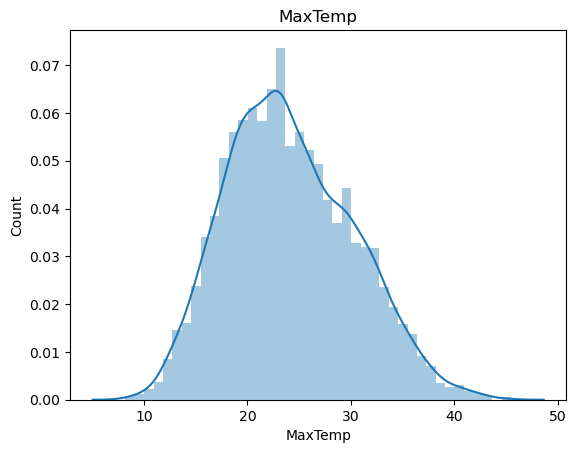

<Figure size 1500x1500 with 0 Axes>

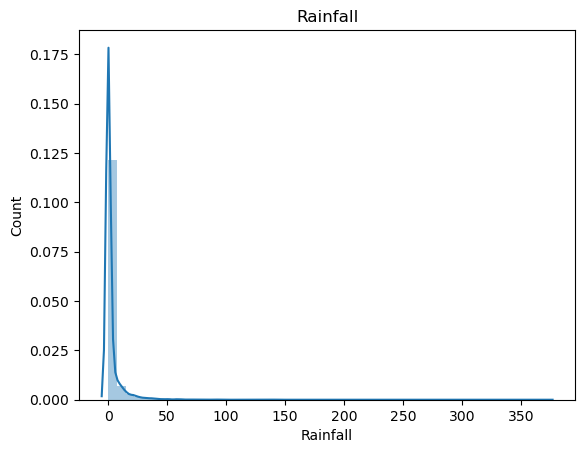

<Figure size 1500x1500 with 0 Axes>

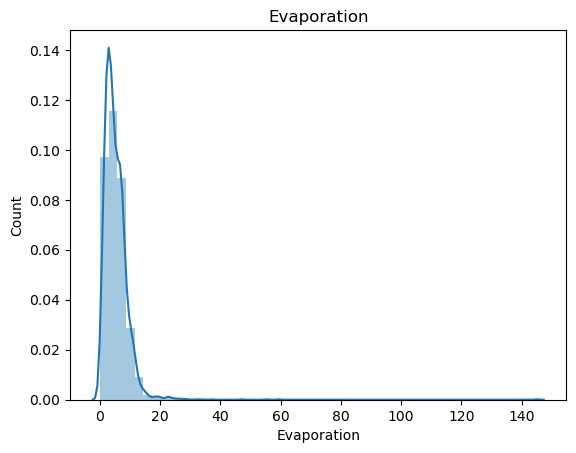

<Figure size 1500x1500 with 0 Axes>

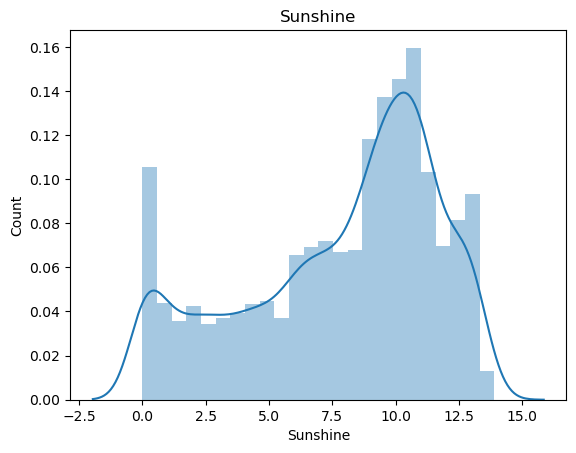

<Figure size 1500x1500 with 0 Axes>

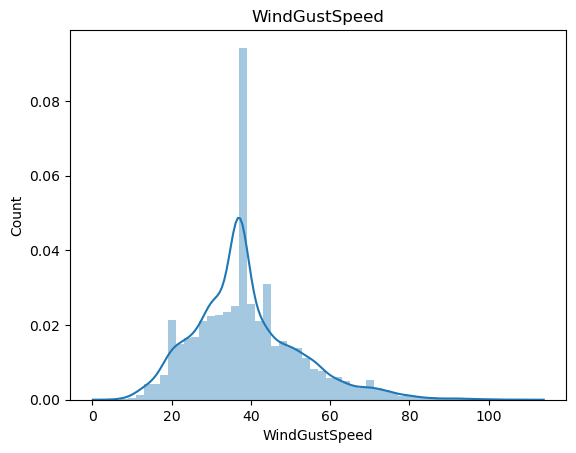

<Figure size 1500x1500 with 0 Axes>

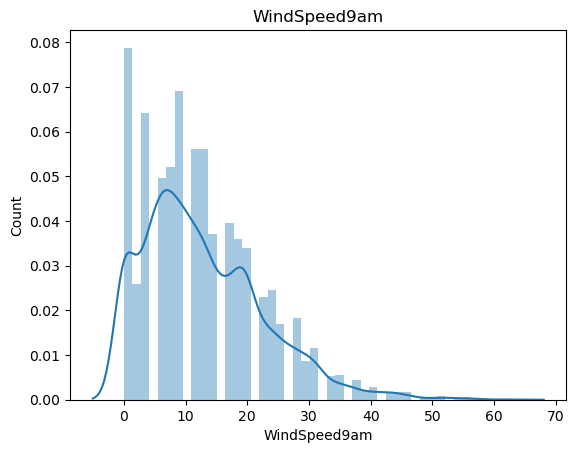

<Figure size 1500x1500 with 0 Axes>

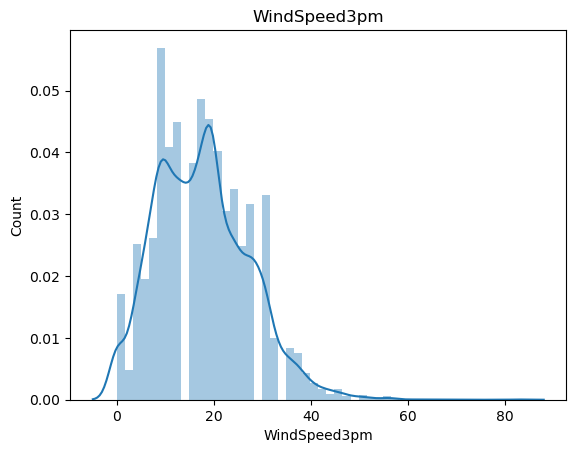

<Figure size 1500x1500 with 0 Axes>

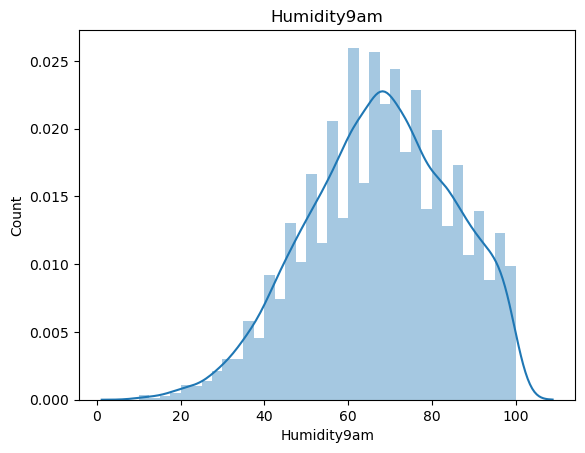

<Figure size 1500x1500 with 0 Axes>

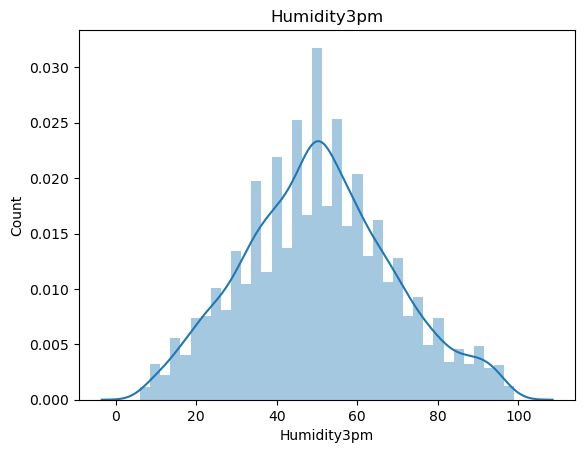

<Figure size 1500x1500 with 0 Axes>

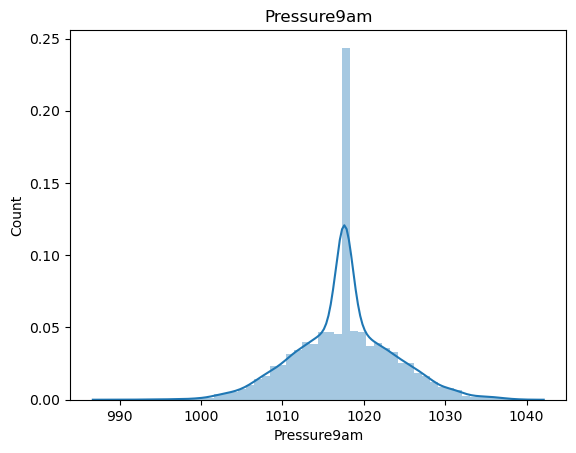

<Figure size 1500x1500 with 0 Axes>

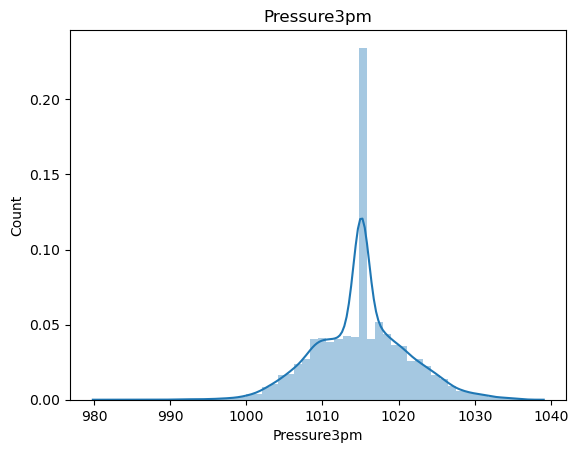

<Figure size 1500x1500 with 0 Axes>

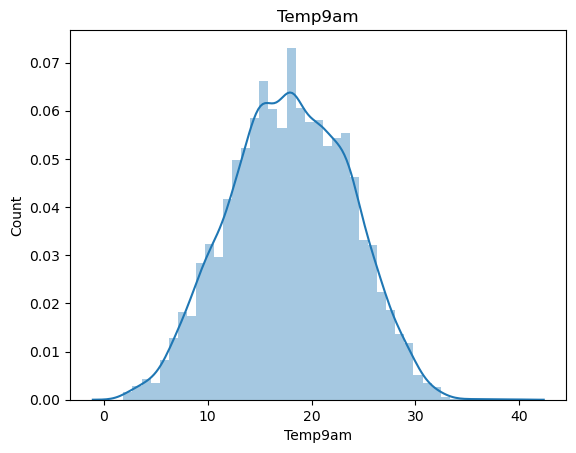

<Figure size 1500x1500 with 0 Axes>

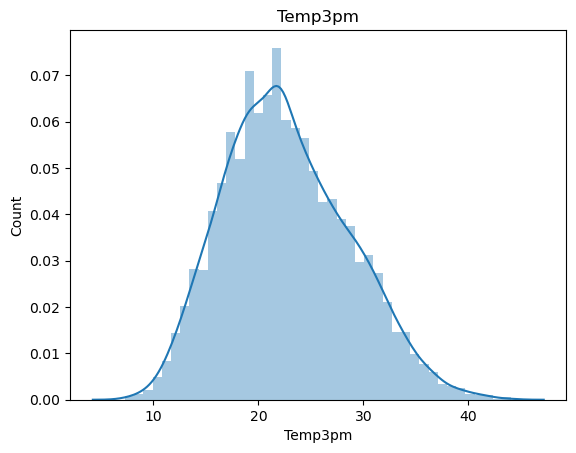

<Figure size 1500x1500 with 0 Axes>

In [24]:
# Checking Distribution of contineous_features

for feature in continuous_feature:
    data= df.copy()
    sns.distplot(df[feature])
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.figure(figsize=(15,15))
    plt.show()


Observation:

here few columns are highly skewed

**boxplot for all the continuous features to see the outliers**

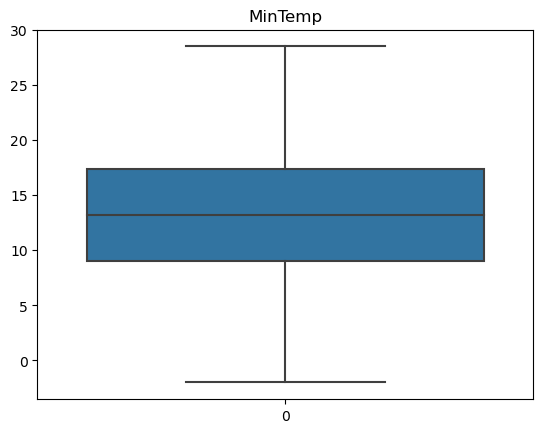

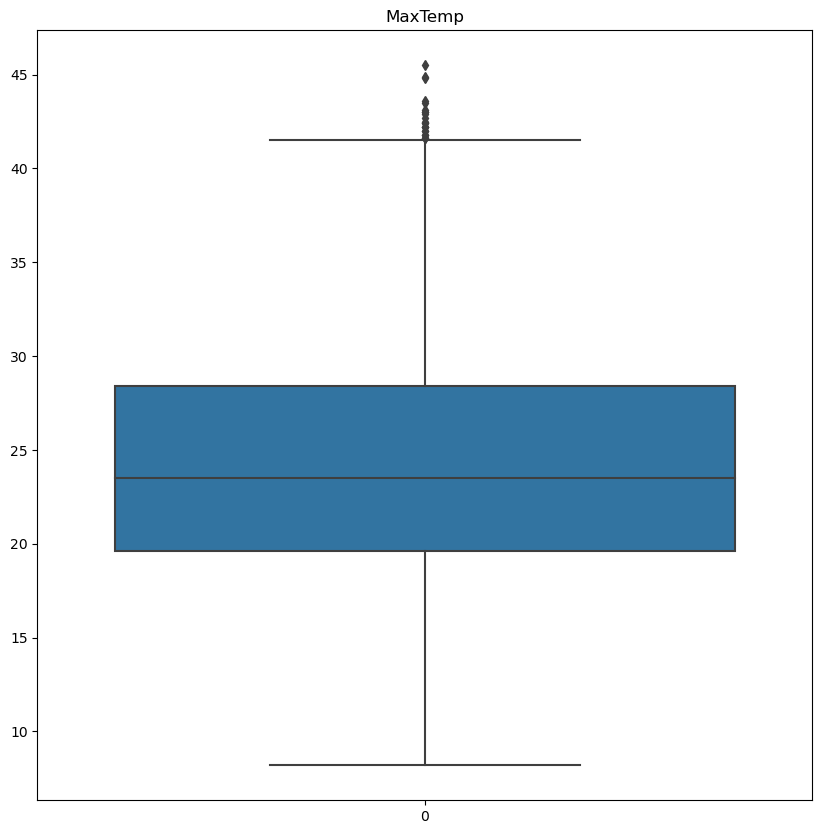

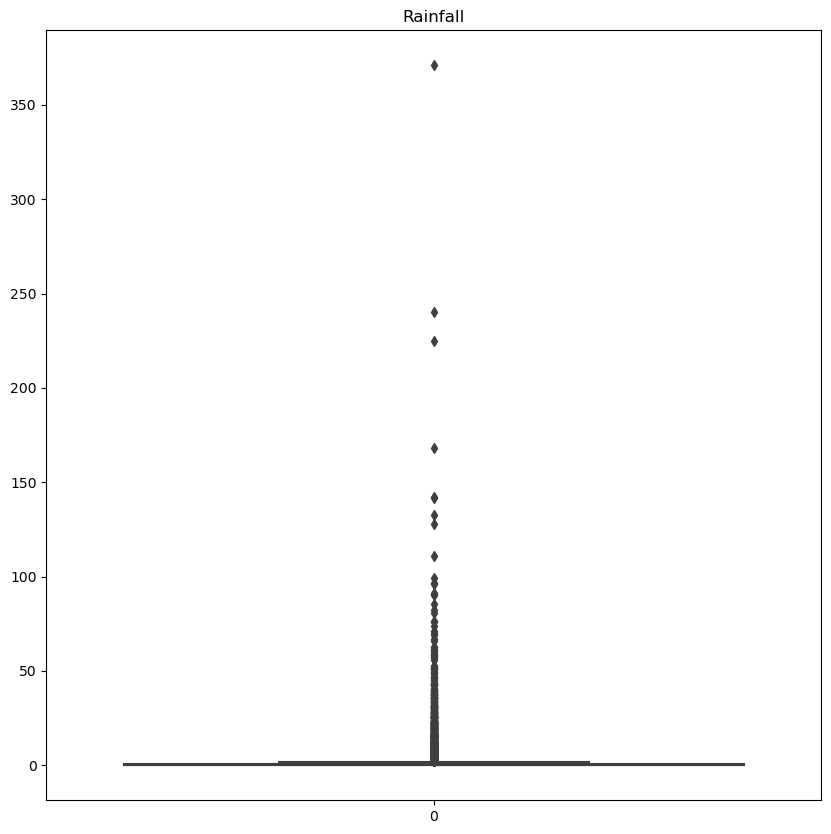

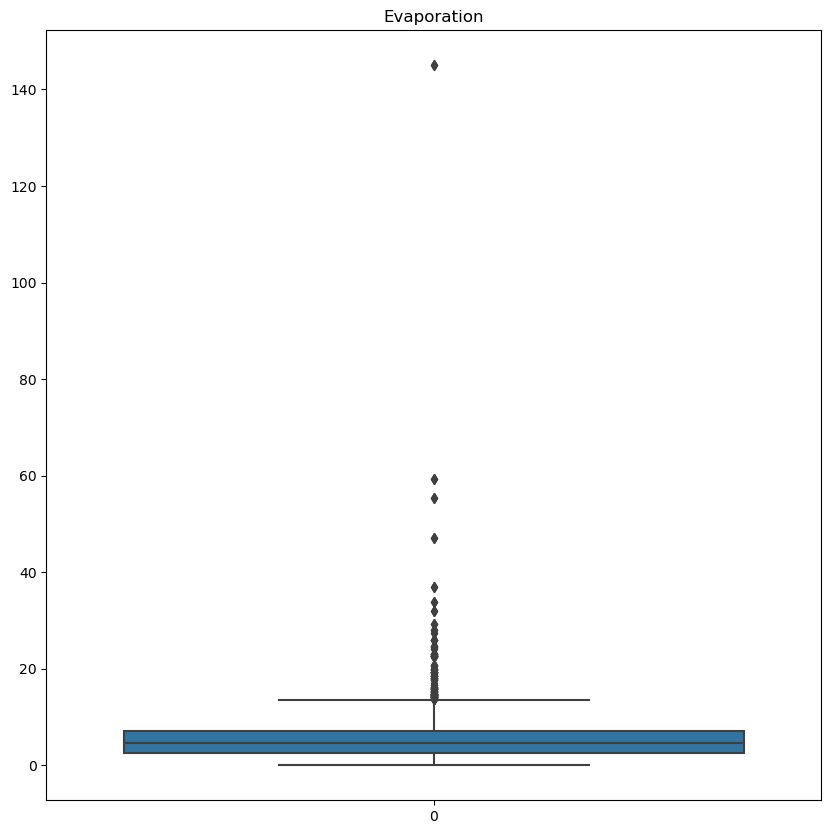

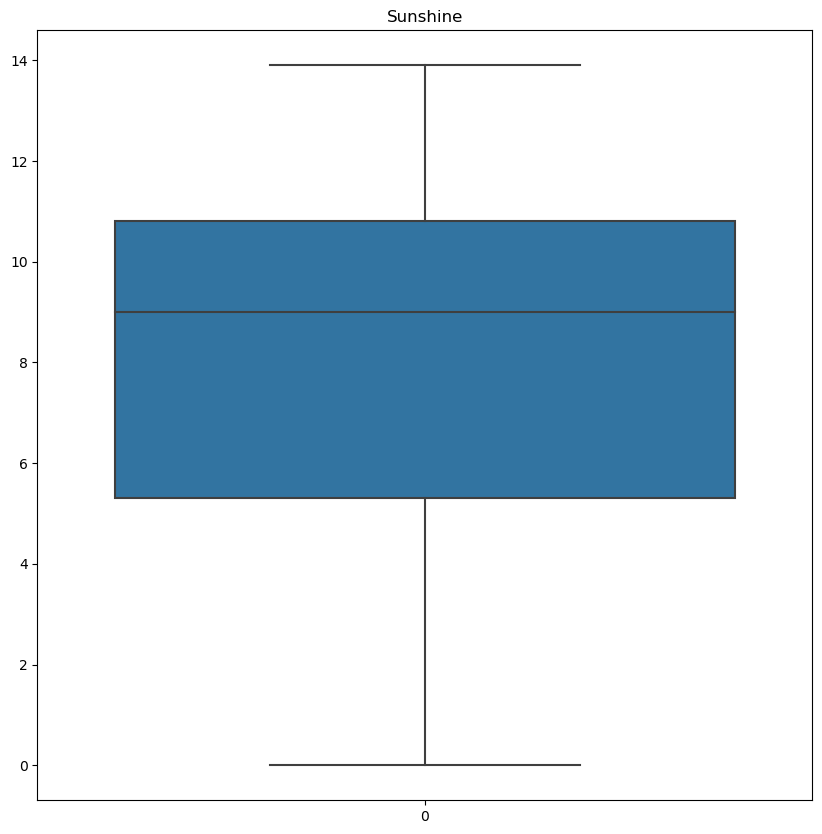

...

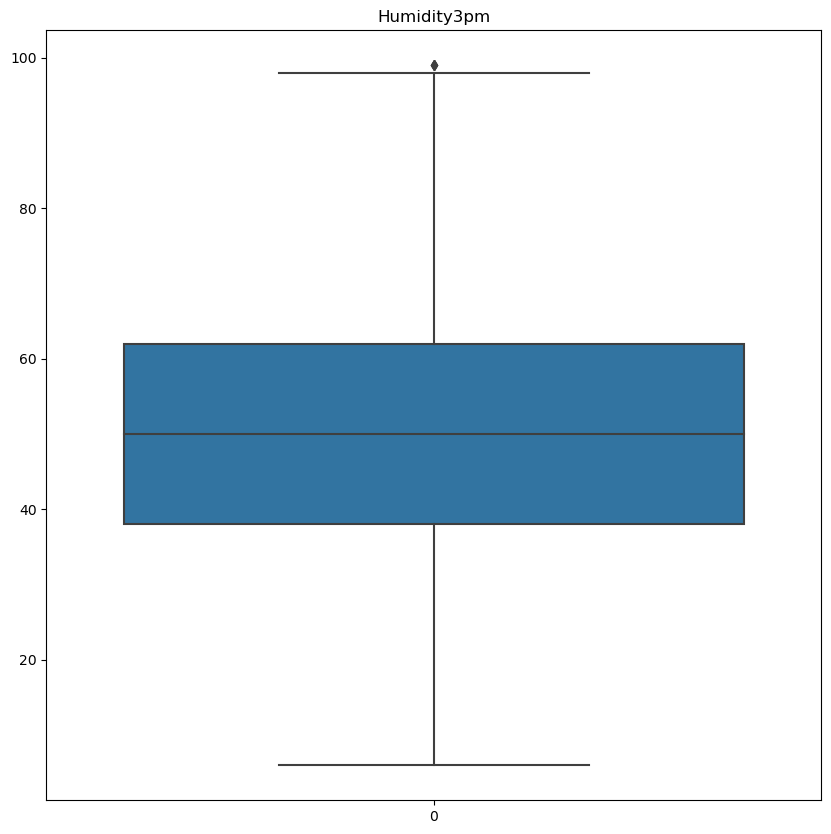

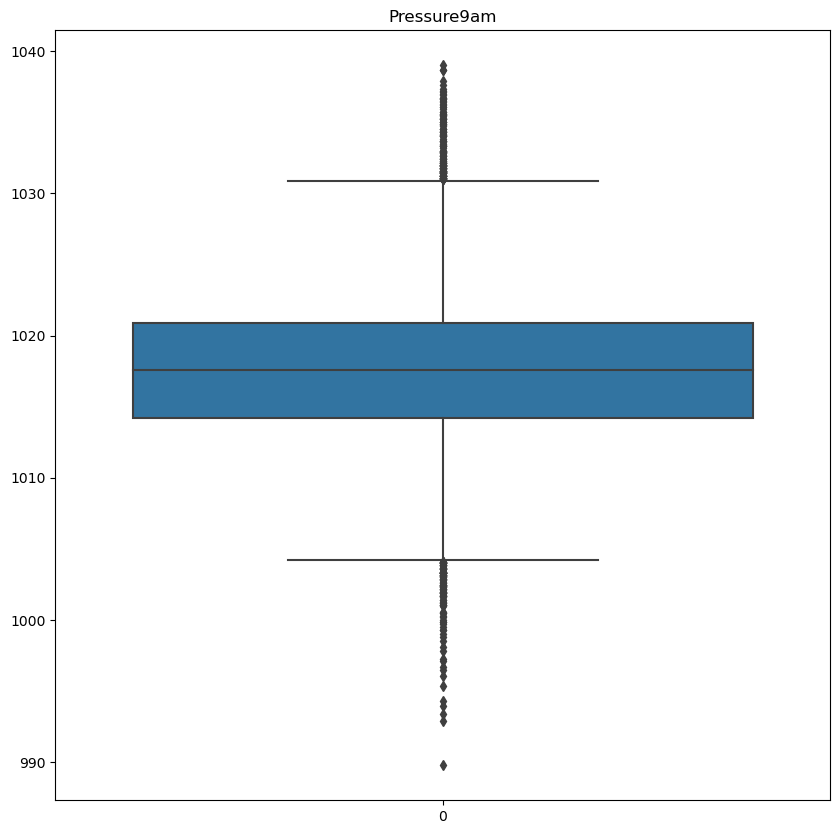

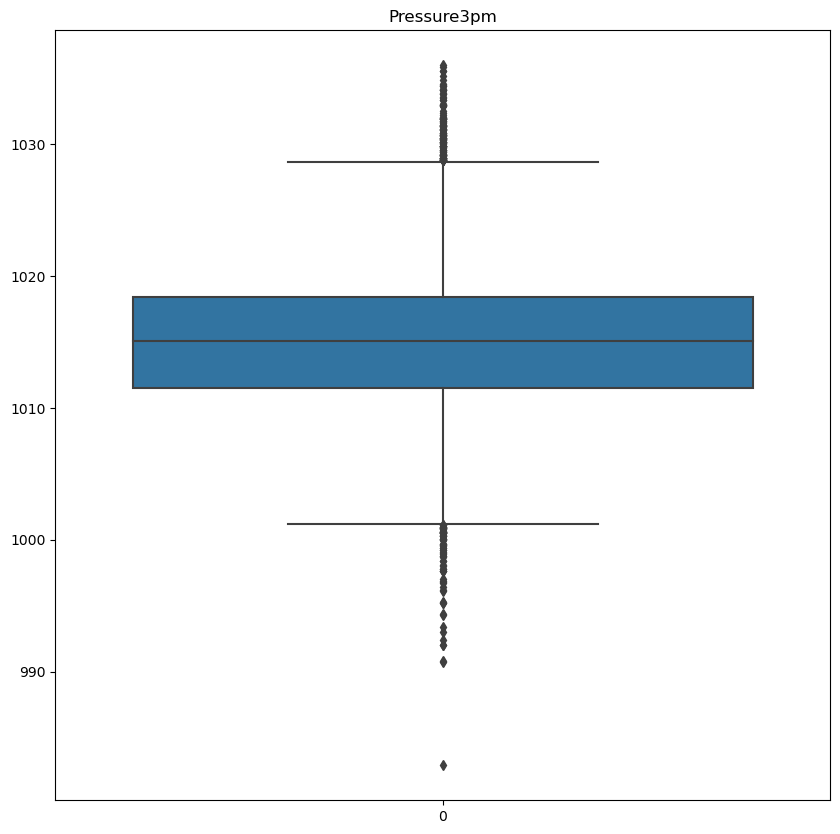

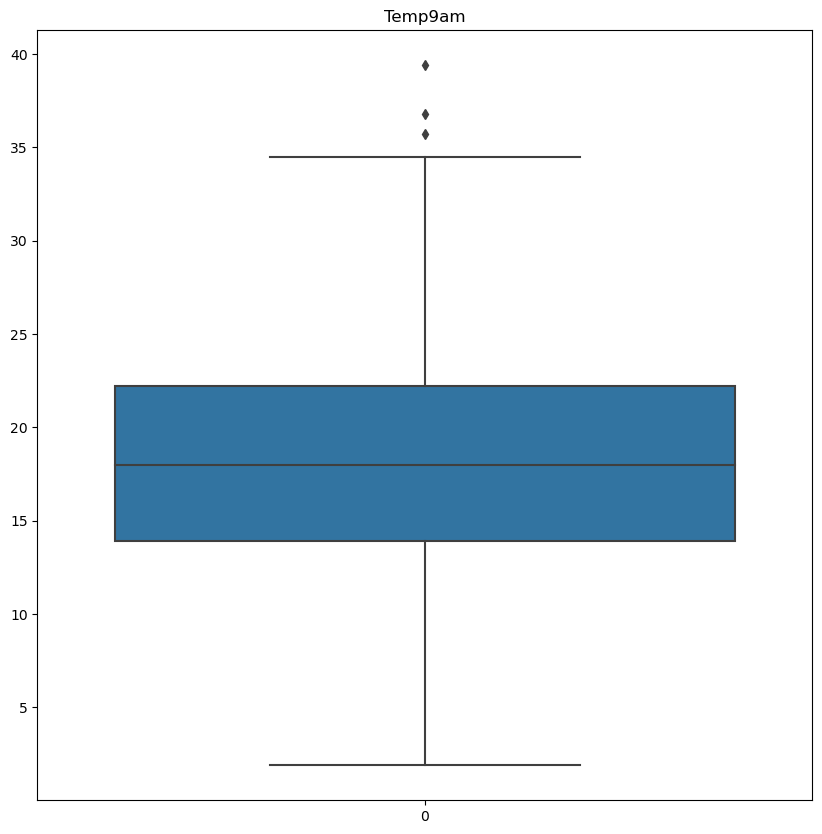

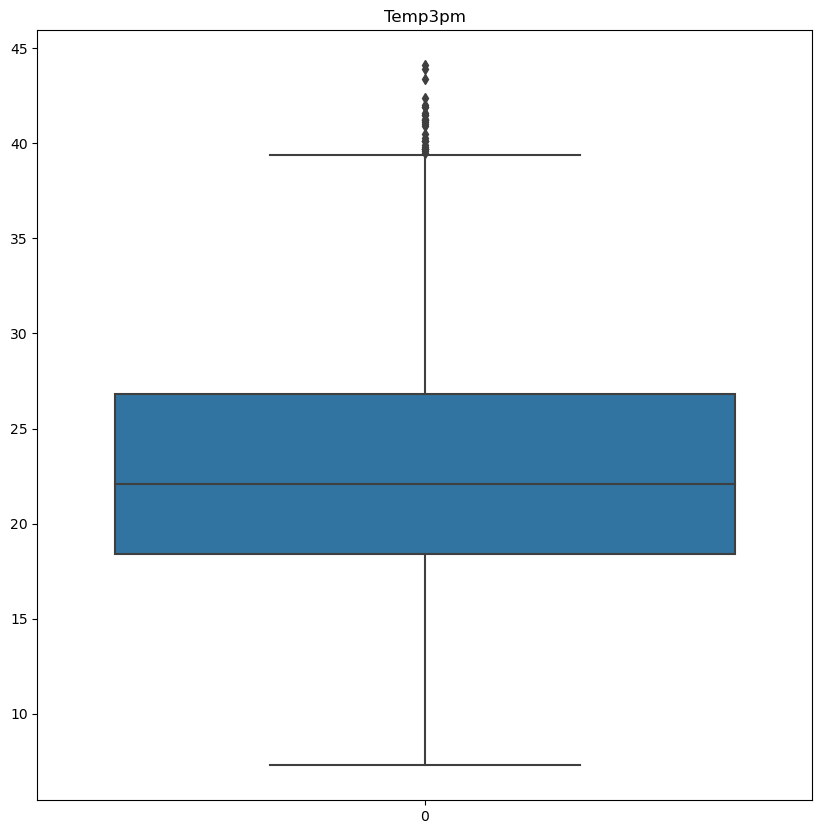

<Figure size 1000x1000 with 0 Axes>

In [26]:
#A for loop is used to plot a boxplot for all the continuous features to see the outliers
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(10,10));

Observation:
There are outliers in almost every column

**Finding Relation between Location and RainTomorrow**

In [27]:
df1 = df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()
df1

RainTomorrow,0,1
Location,,
Adelaide,160.0,45.0
Albury,708.0,199.0
Brisbane,444.0,135.0
CoffsHarbour,425.0,186.0
Darwin,218.0,32.0
Melbourne,608.0,203.0
Newcastle,624.0,198.0
Penrith,366.0,116.0
PerthAirport,962.0,242.0


Analysis of Rainfall Data by Location:
In this study, we explored the occurrence of rainy (1) and non-rainy (0) days across various locations. Key findings include:

Highest Rainy Days: "PerthAirport" registers the highest count of rainy days (1) at 962, indicating frequent rainy weather.

Lowest Rainy Days: "Uluru" reports the lowest count of rainy days (1) at 39. However, note that "Uluru" has missing values (NaN) for non-rainy days (0).

Variability Across Locations: Significant variability exists in rainy and non-rainy day distributions. Some locations, like "Darwin" and "CoffsHarbour," exhibit a higher proportion of rainy days.

High Total Count: "Albury" has a substantial total count of both rainy and non-rainy days, reflecting a rich dataset for this location.

Missing Values: Several locations have missing values (NaN) for non-rainy days, warranting further investigation or handling based on analysis goals.

These insights offer valuable information on regional rainfall patterns, aiding further analysis and supporting decisions related to weather forecasts and planning.

In [28]:
#Shorting in descending order

df1[1].sort_values(ascending = False)

Location
PerthAirport    242.0
Melbourne       203.0
Albury          199.0
Newcastle       198.0
CoffsHarbour    186.0
Williamtown     153.0
Brisbane        135.0
Penrith         116.0
Wollongong       63.0
Adelaide         45.0
Darwin           32.0
Uluru             NaN
Name: 1, dtype: float64

In [29]:
df1[1].sort_values(ascending = False).index

Index(['PerthAirport', 'Melbourne', 'Albury', 'Newcastle', 'CoffsHarbour',
       'Williamtown', 'Brisbane', 'Penrith', 'Wollongong', 'Adelaide',
       'Darwin', 'Uluru'],
      dtype='object', name='Location')

In [30]:
len(df1[1].sort_values(ascending = False).index)

12

In [31]:
location = {'PerthAirport':1, 'Melbourne':2, 'Albury':3, 'Newcastle':4, 'CoffsHarbour':5,
       'Williamtown':6, 'Brisbane':7, 'Penrith':8, 'Wollongong':9, 'Adelaide':10,
       'Darwin':11, 'Uluru':12}
df["Location"] = df["Location"].map(location)

we arranged all the locations in descending order according to their Rainfall and then we encoded all the locations


In [32]:
# Converting Date Column into Datetimr format

df["Date"] = pd.to_datetime(df["Date"], format = "%Y-%m-%dT", errors = "coerce")

In [33]:
df["Date_month"] = df["Date"].dt.month
df["Date_day"] = df["Date"].dt.day

In [34]:
# Dropping Date Column Because i have created Month And day from this

df.drop('Date',axis=1,inplace=True)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,3,13.4,22.9,0.6,4.2,3.8,4.0,44.0,5.0,3.0,...,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0,12,1
1,3,7.4,25.1,0.0,8.0,9.9,2.0,44.0,0.0,6.0,...,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0,12,2
2,3,12.9,25.7,0.0,2.0,5.8,5.0,46.0,5.0,6.0,...,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0,12,3
3,3,9.2,28.0,0.0,2.8,10.1,11.0,24.0,13.0,14.0,...,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0,12,4
4,3,17.5,32.3,1.0,1.2,9.5,4.0,41.0,12.0,0.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,12,2.8,23.4,0.0,7.6,9.9,15.0,31.0,13.0,13.0,...,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0,6,21
8421,12,3.6,25.3,0.0,9.4,12.1,0.0,22.0,13.0,2.0,...,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0,6,22
8422,12,5.4,26.9,0.0,2.4,6.7,3.0,37.0,13.0,3.0,...,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0,6,23
8423,12,7.8,27.0,0.0,4.0,0.0,12.0,28.0,11.0,2.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0,6,24


**checking Outliers**

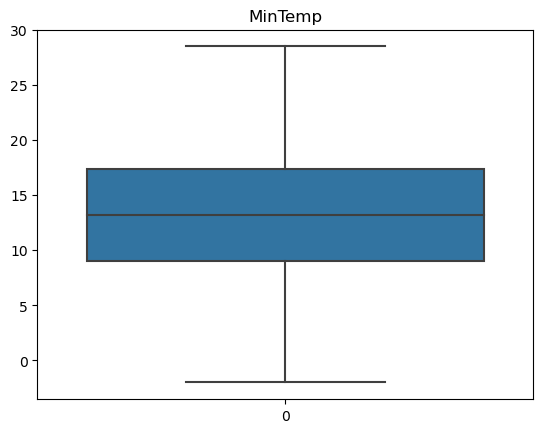

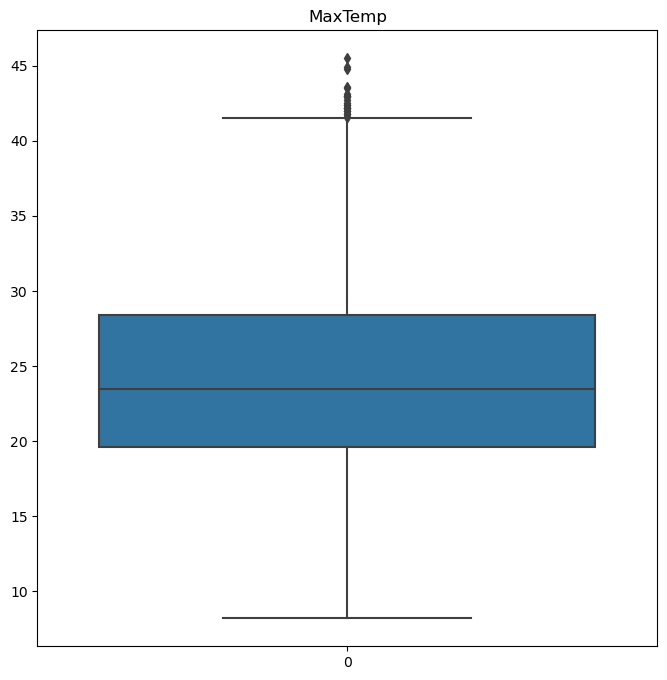

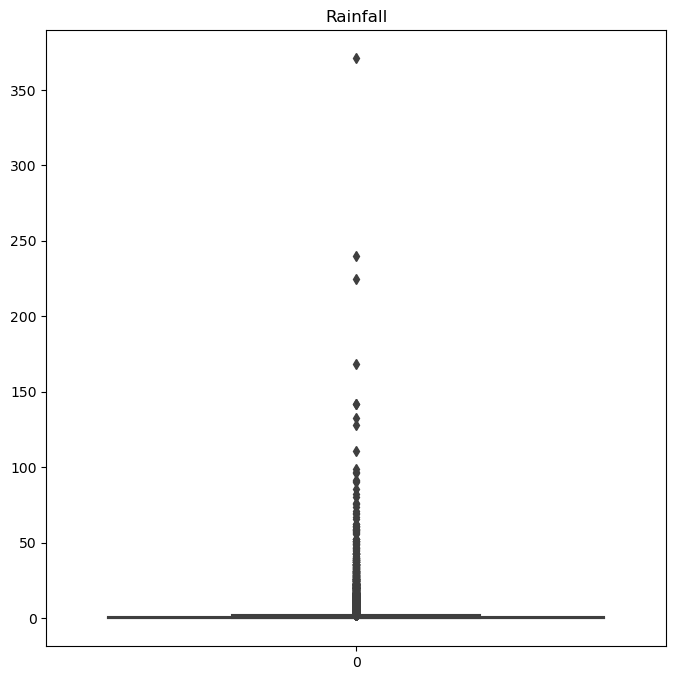

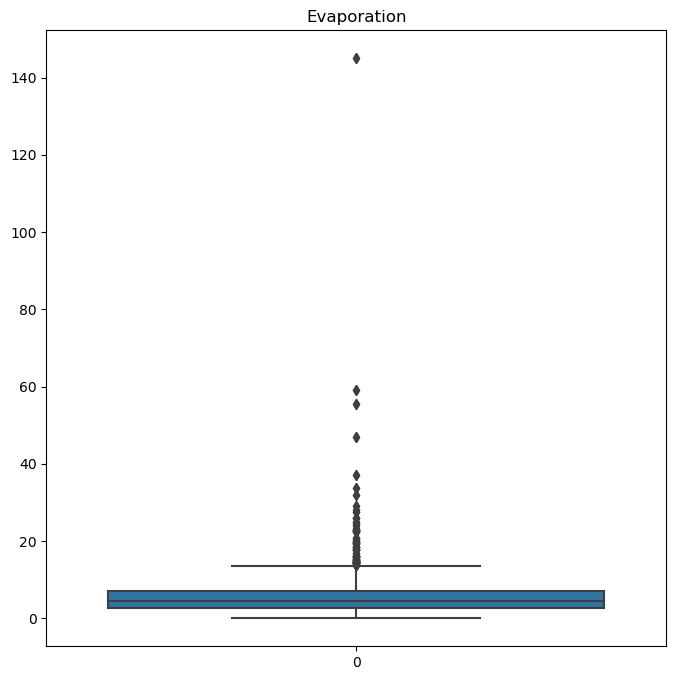

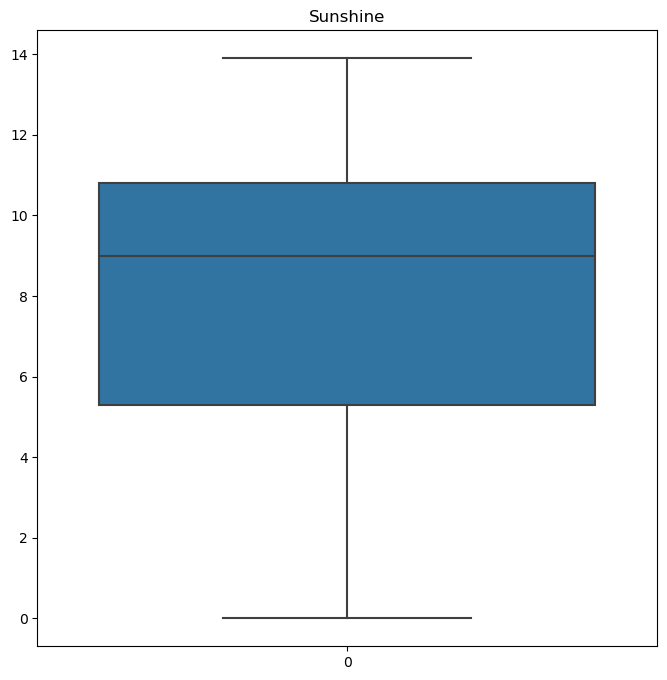

...

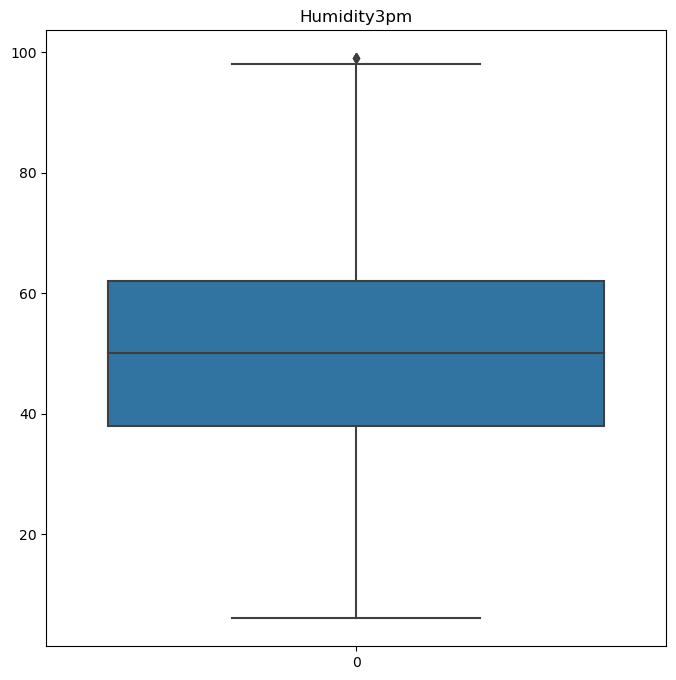

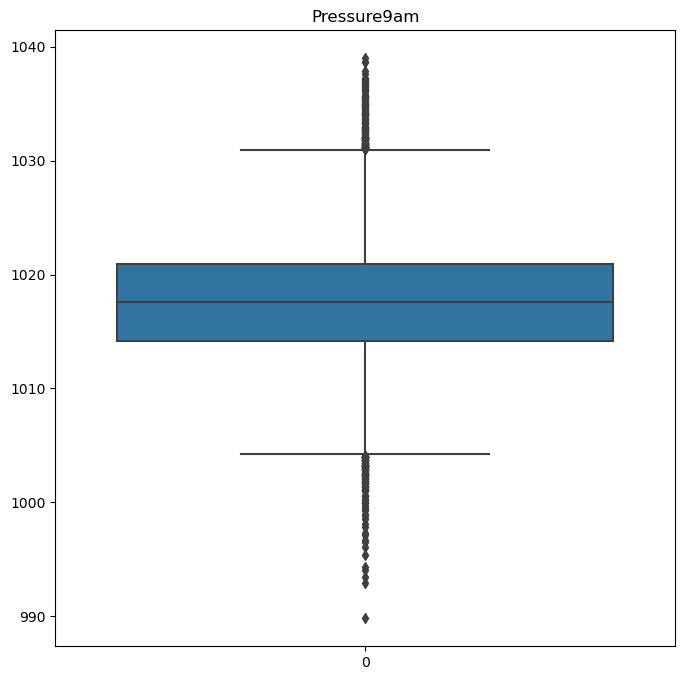

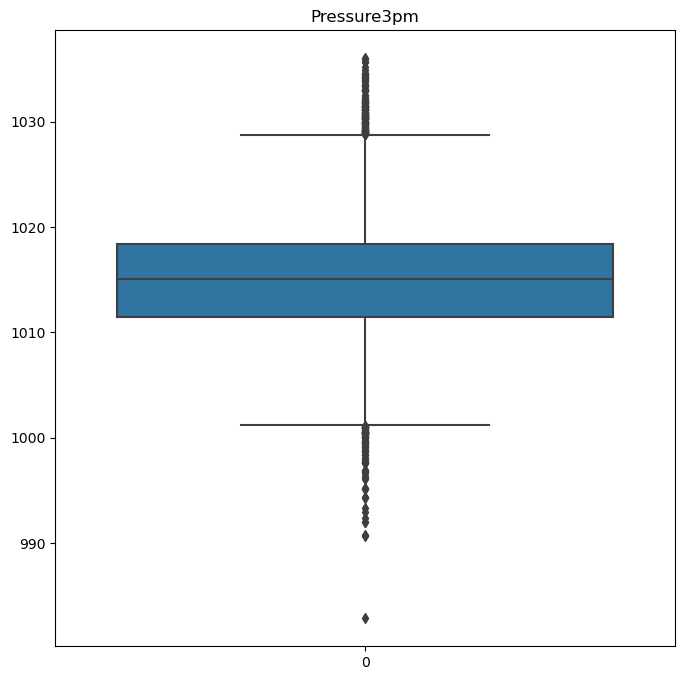

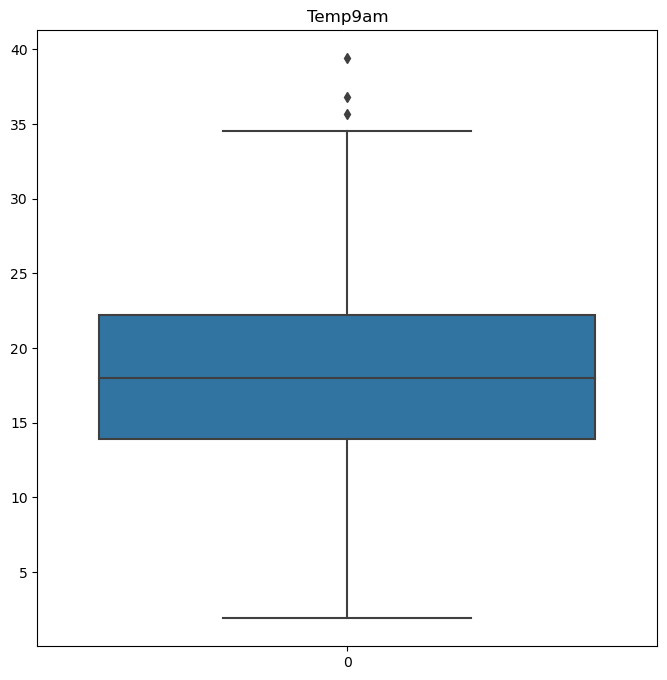

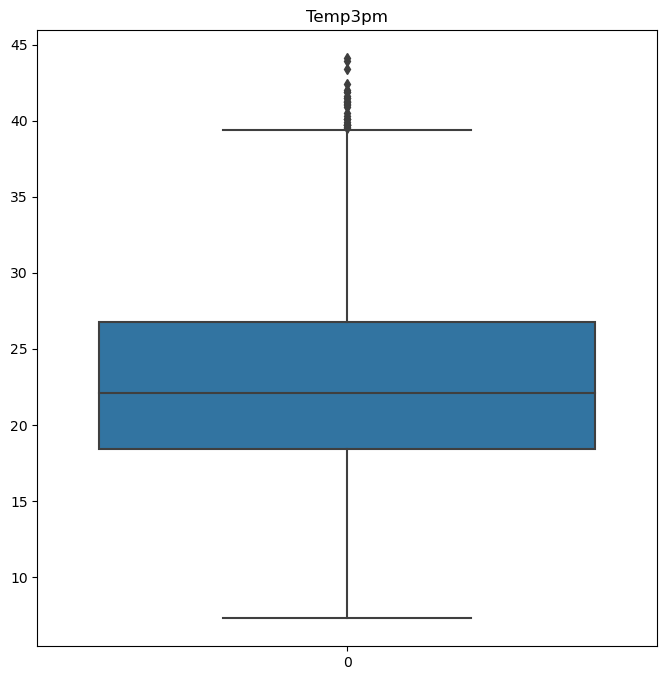

<Figure size 800x800 with 0 Axes>

In [37]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(8,8))

In [38]:
for feature in continuous_feature:
    print(feature)

MinTemp
MaxTemp
Rainfall
Evaporation
Sunshine
WindGustSpeed
WindSpeed9am
WindSpeed3pm
Humidity9am
Humidity3pm
Pressure9am
Pressure3pm
Temp9am
Temp3pm


**Removing Outliers from Contineous Feature By Quantile Method**

In [39]:
#MinTemp
IQR=df.MinTemp.quantile(0.75)-df.MinTemp.quantile(0.25)
lower_bridge=df.MinTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MinTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-3.599999999999998 29.999999999999996


In [40]:
df.loc[df['MinTemp']>=29.99,'MinTemp']=29.99
df.loc[df['MinTemp']<=-3.59,'MinTemp']=-3.59

In [41]:
#MaxTemp
IQR=df.MaxTemp.quantile(0.75)-df.MaxTemp.quantile(0.25)
lower_bridge=df.MaxTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MaxTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

6.400000000000006 41.599999999999994


In [42]:
df.loc[df['MaxTemp']>=41.59,'MaxTemp']=41.59
df.loc[df['MaxTemp']<=6.40,'MaxTemp']=6.40

In [43]:
df.loc[df['Rainfall']>=2.0,'Rainfall']=2.0
df.loc[df['Rainfall']<=-1.20,'Rainfall']=-1.20

In [44]:
#Evaporation
IQR=df.Evaporation.quantile(0.75)-df.Evaporation.quantile(0.25)
lower_bridge=df.Evaporation.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Evaporation.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-4.0 13.600000000000001


In [45]:
#WindGustSpeed
IQR=df.WindGustSpeed.quantile(0.75)-df.WindGustSpeed.quantile(0.25)
lower_bridge=df.WindGustSpeed.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindGustSpeed.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

6.0 70.0


In [46]:
#WindSpeed9am
IQR=df.WindSpeed9am.quantile(0.75)-df.WindSpeed9am.quantile(0.25)
lower_bridge=df.WindSpeed9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-13.5 38.5


In [47]:
#WindSpeed3pm
IQR=df.WindSpeed3pm.quantile(0.75)-df.WindSpeed3pm.quantile(0.25)
lower_bridge=df.WindSpeed3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-8.5 43.5


In [48]:
#Humidity9am
IQR=df.Humidity9am.quantile(0.75)-df.Humidity9am.quantile(0.25)
lower_bridge=df.Humidity9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Humidity9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

20.0 116.0


In [49]:
#Pressure9am
IQR=df.Pressure9am.quantile(0.75)-df.Pressure9am.quantile(0.25)
lower_bridge=df.Pressure9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Pressure9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1004.1500000000001 1030.9499999999998


In [50]:
#Temp3pm
IQR=df.Temp3pm.quantile(0.75)-df.Temp3pm.quantile(0.25)
lower_bridge=df.Temp3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Temp3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

5.799999999999995 39.400000000000006


**Boxplot After Removing Outliers**

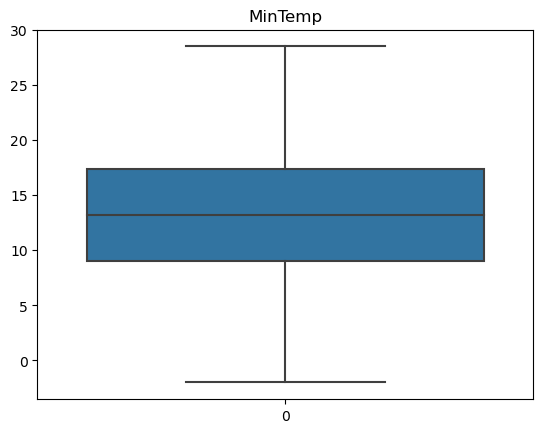

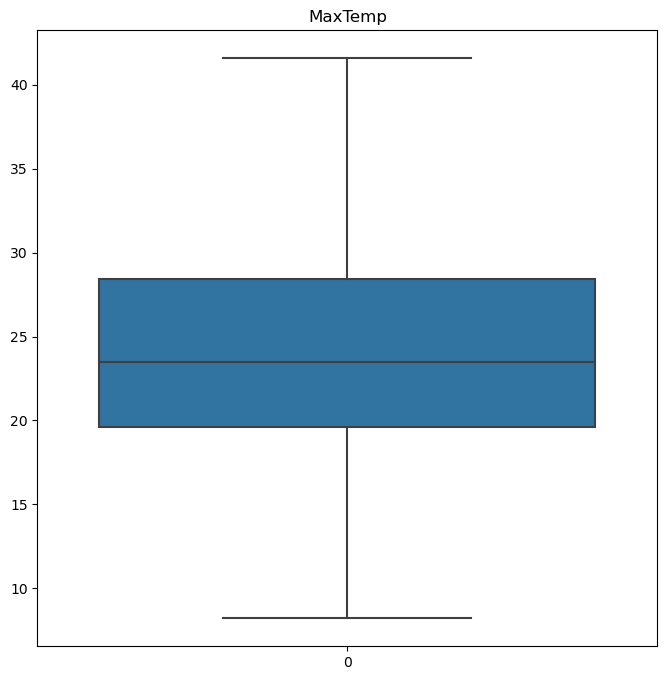

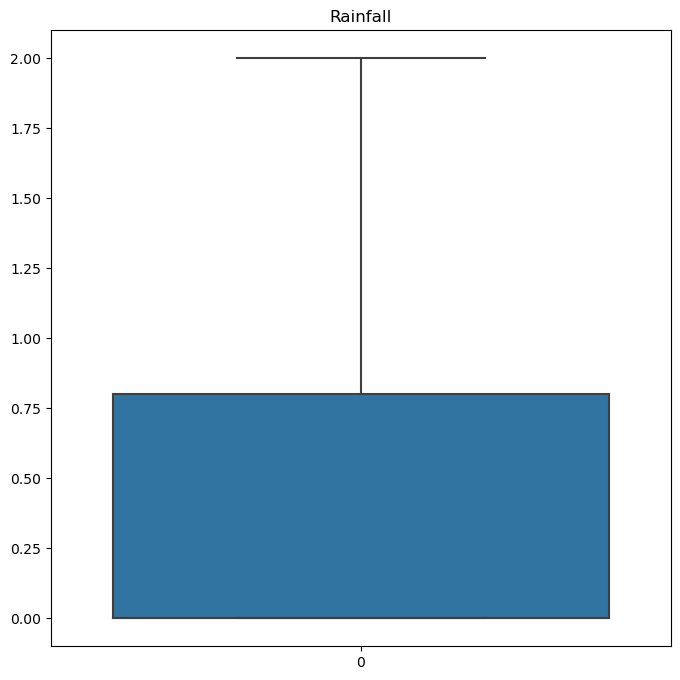

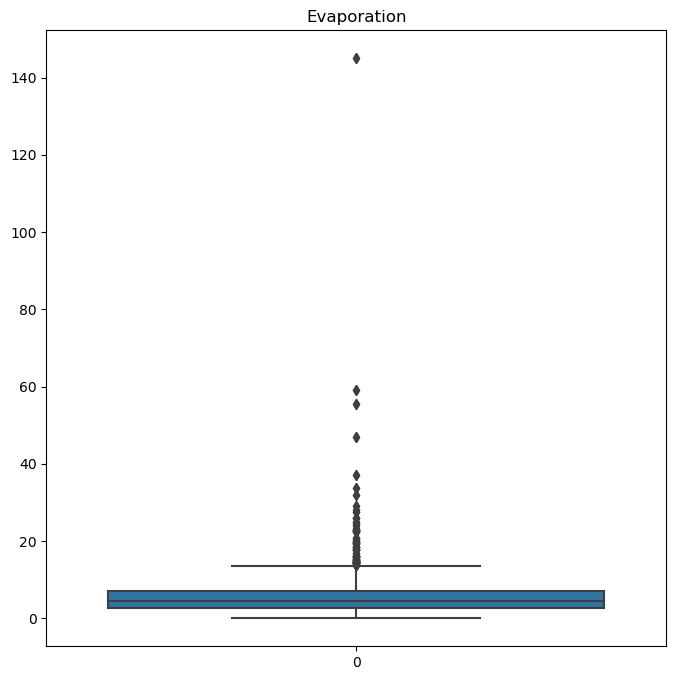

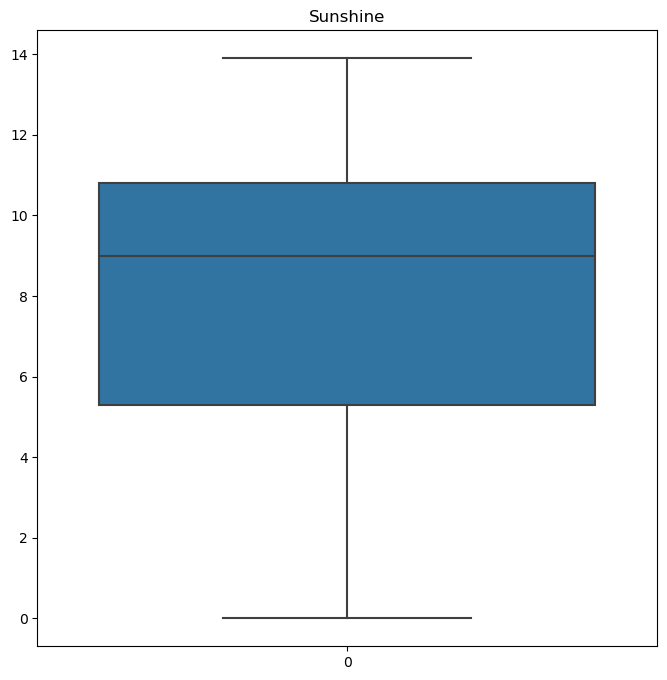

...

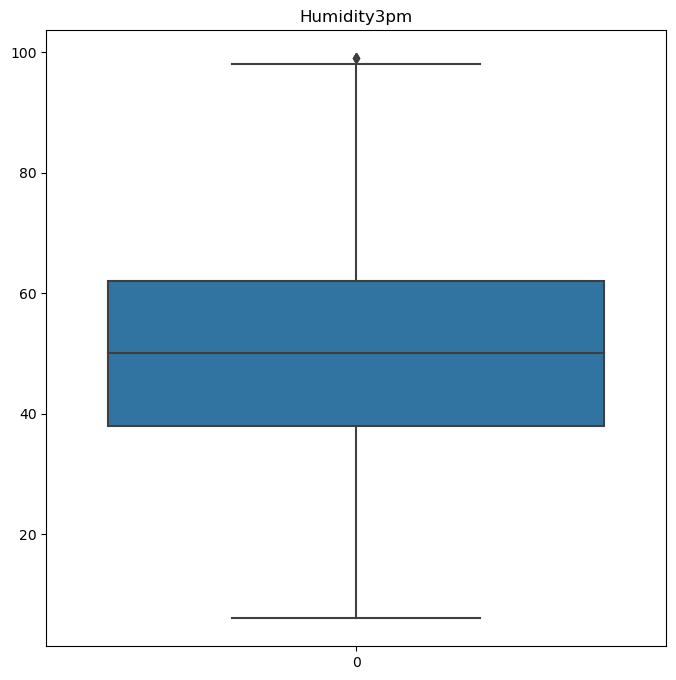

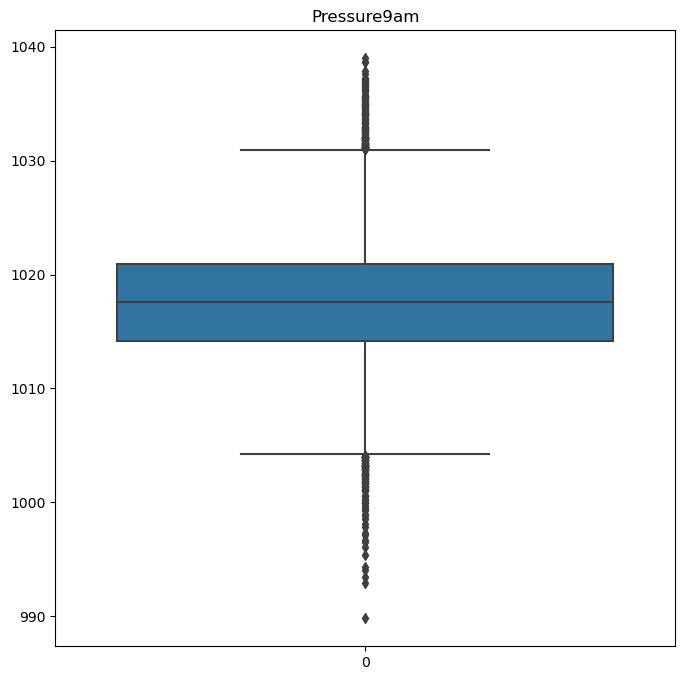

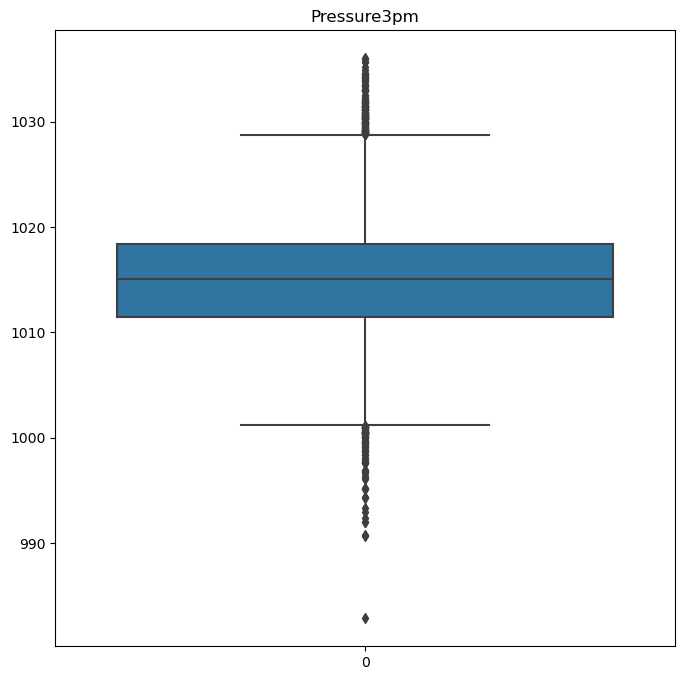

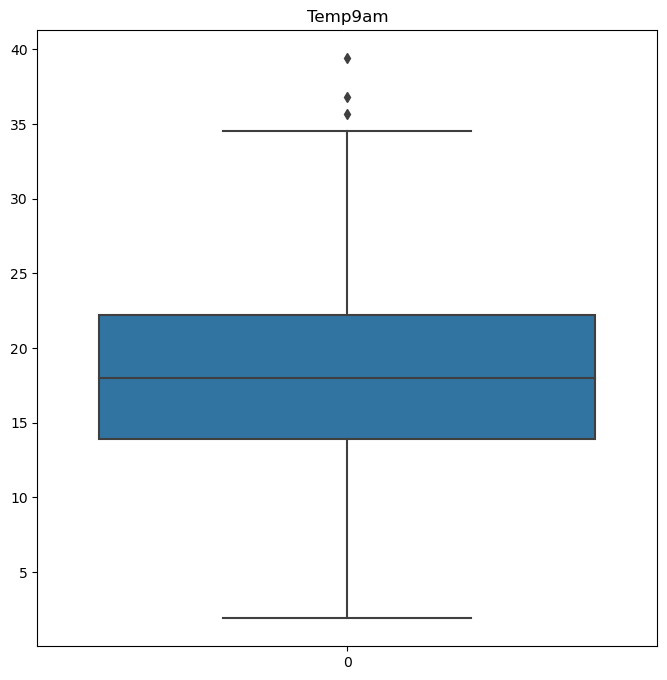

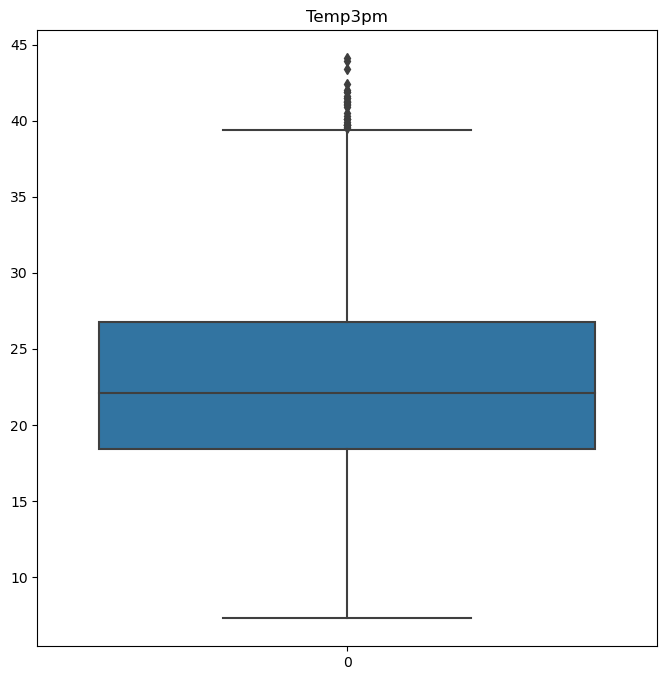

<Figure size 800x800 with 0 Axes>

In [51]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(8,8))

**Here i am SavingCleaned Data Because i have to make 2 models in this project**

In [52]:
file_path = "clean_data.csv"
df.to_csv(file_path, index=False)

**Here i am checking Distribution of contineous feature by QQ Plot**

In [53]:
def qq_plots(df, variable):
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.show()

MinTemp


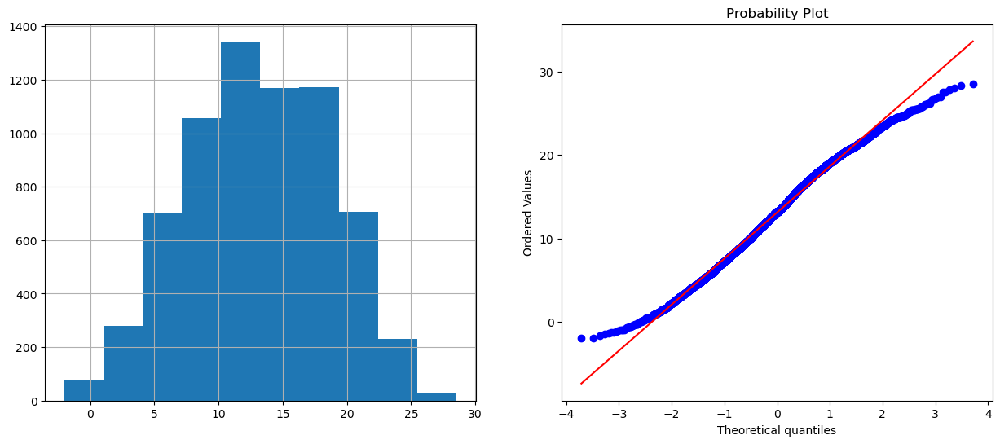

MaxTemp


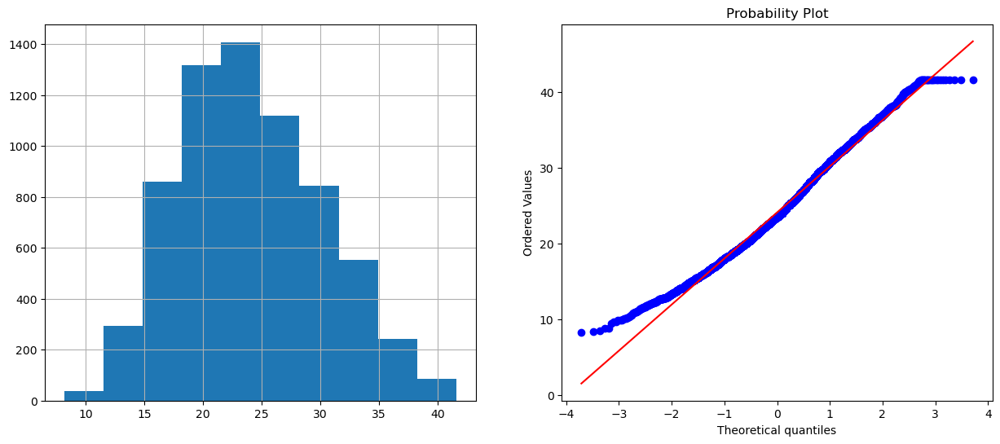

Rainfall


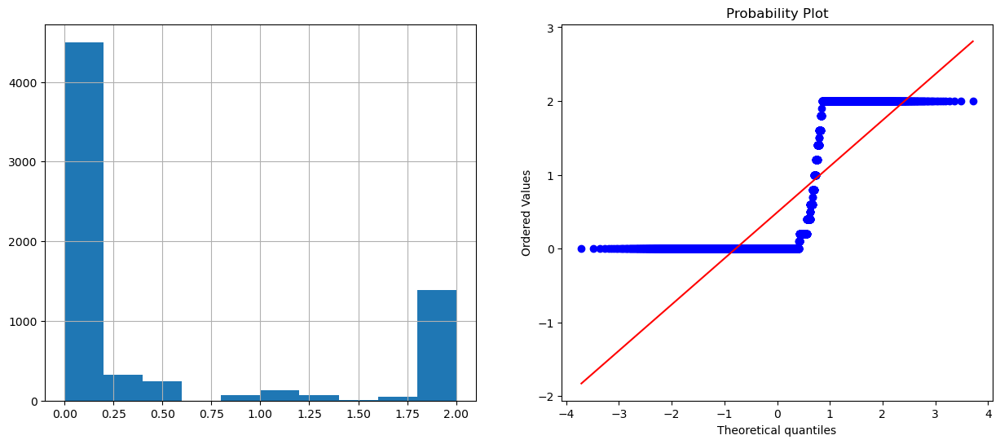

Evaporation


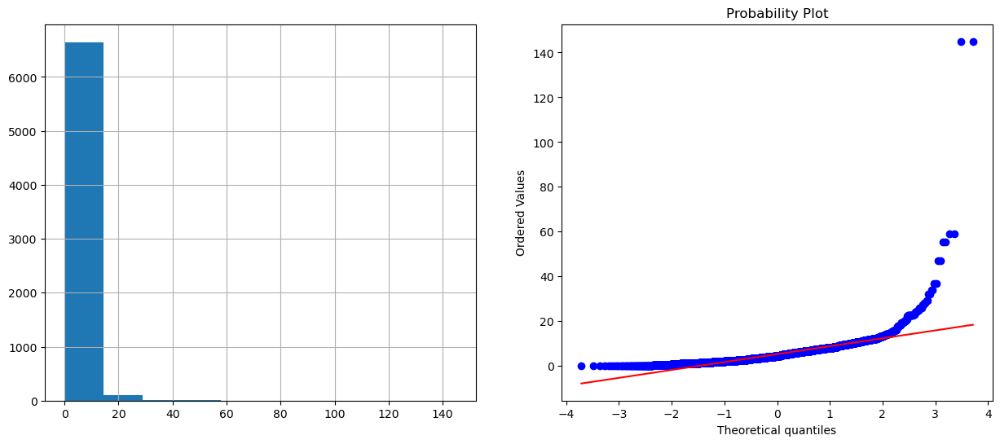

Sunshine


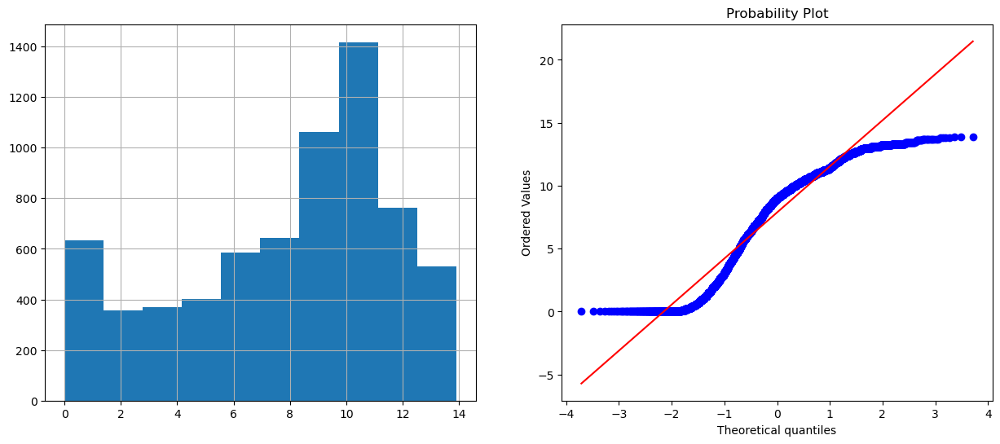

WindGustSpeed


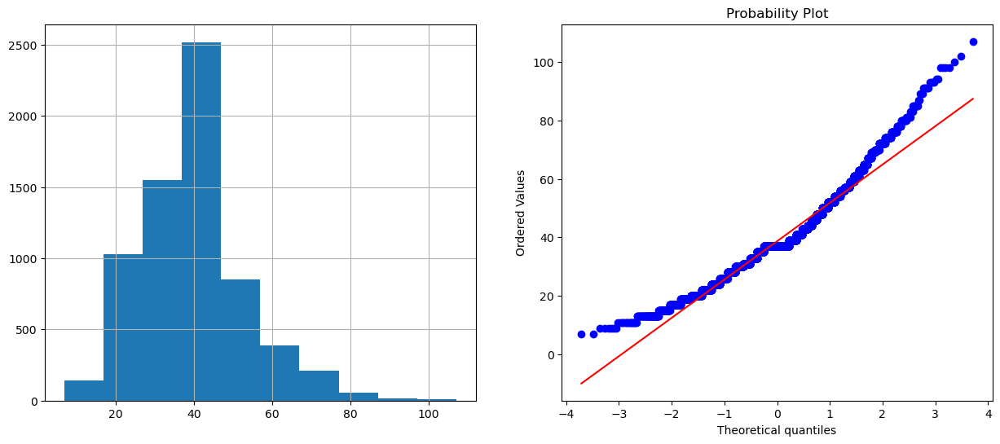

WindSpeed9am


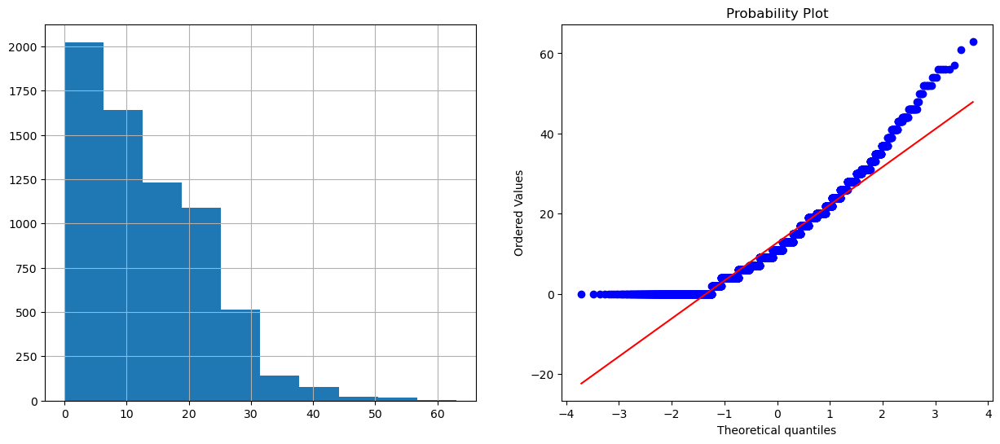

WindSpeed3pm


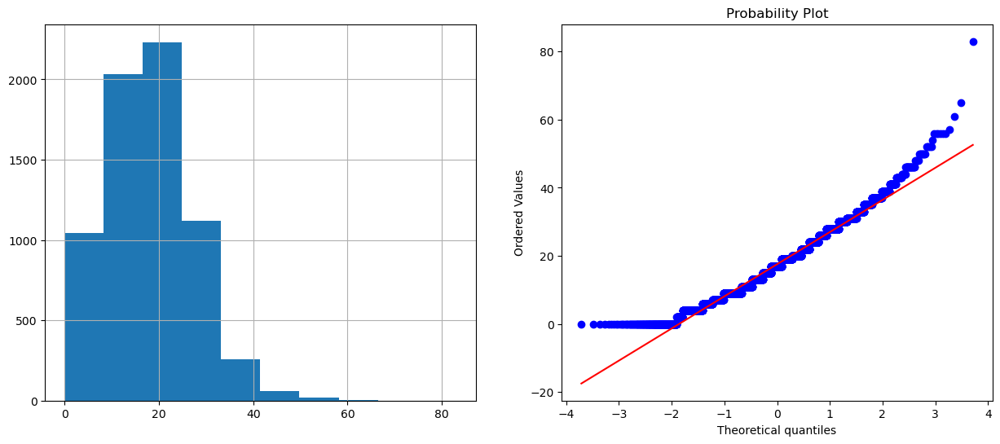

Humidity9am


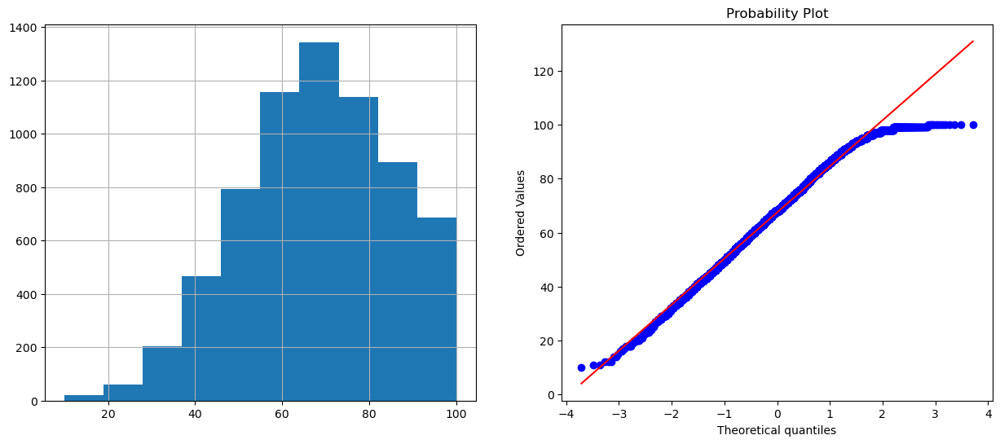

Humidity3pm


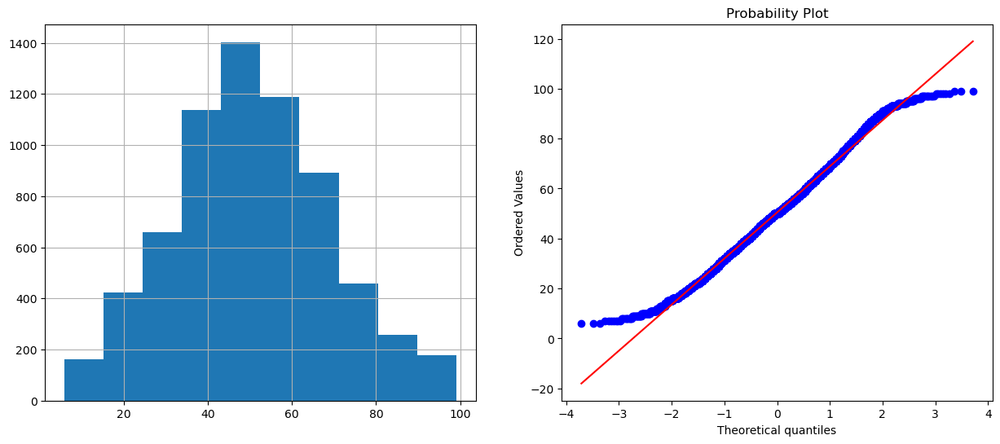

Pressure9am


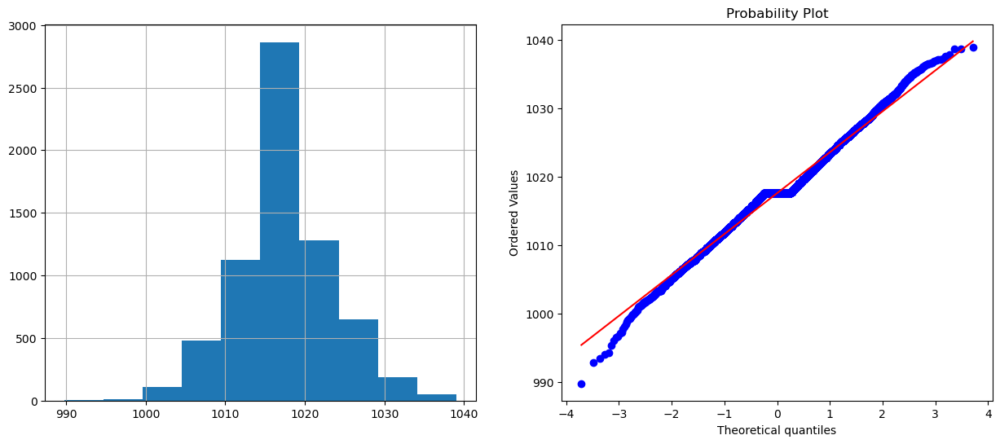

Pressure3pm


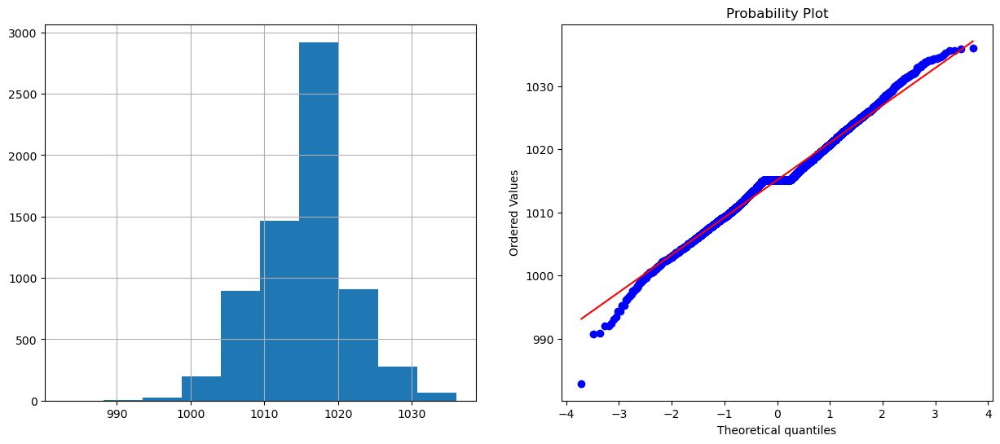

Temp9am


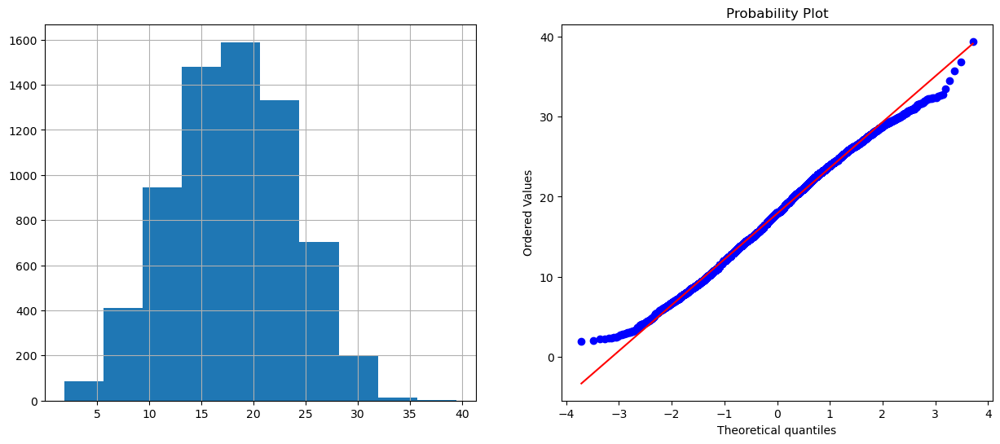

Temp3pm


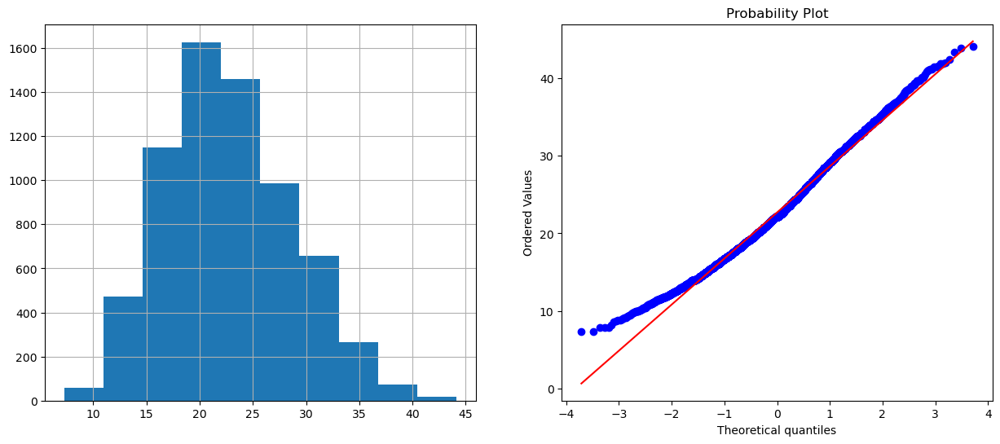

In [54]:
for feature in continuous_feature:
    print(feature)
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[feature].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.show()

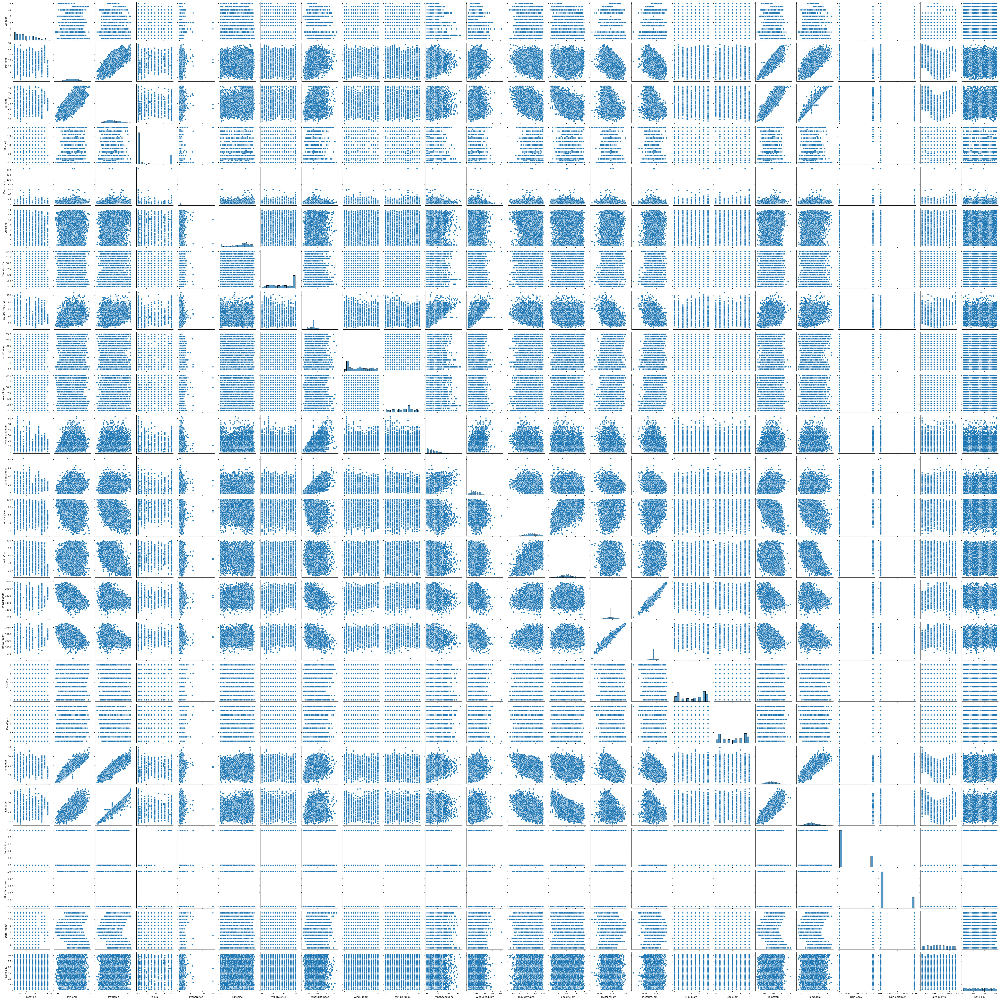

In [55]:
#Pairplot

sns.pairplot(df)


**Checking Correlation with Target Column**

In [56]:
#correlation with target column

correlation_with_quality = df.corr()['RainTomorrow'].abs().sort_values(ascending=False)
print(correlation_with_quality)

RainTomorrow     1.000000
Humidity3pm      0.466880
Rainfall         0.342188
RainToday        0.323691
Cloud3pm         0.301822
Humidity9am      0.287808
Sunshine         0.250066
Cloud9am         0.249621
Temp3pm          0.202781
WindGustSpeed    0.184400
MaxTemp          0.160080
Pressure9am      0.159118
Pressure3pm      0.131771
MinTemp          0.097173
WindDir9am       0.092090
WindGustDir      0.078294
WindSpeed9am     0.057780
WindDir3pm       0.051787
WindSpeed3pm     0.043539
Evaporation      0.042444
Temp9am          0.025768
Date_day         0.007560
Location         0.006541
Date_month       0.003575
Name: RainTomorrow, dtype: float64


In [57]:
# dropping irrelevant columns

df.drop(columns=['Date_month','Location','Date_day'],axis=1,inplace=True)

**Checking correlation with other features**

In [58]:
#schecking correlation

df_corr = df.corr()
df_corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
MinTemp,1.000000,0.728411,0.078959,0.206801,0.017771,0.139791,0.242823,0.214943,0.120503,0.168996,...,-0.154218,0.067847,-0.441143,-0.440282,0.082083,0.043964,0.891417,0.696861,0.075902,0.097173
MaxTemp,0.728411,1.000000,-0.241276,0.260769,0.243480,0.149543,0.165947,0.230427,0.060458,0.056531,...,-0.425158,-0.430275,-0.337745,-0.413031,-0.209251,-0.205666,0.867111,0.974866,-0.225613,-0.160080
Rainfall,0.078959,-0.241276,1.000000,-0.082976,-0.185309,-0.045857,0.085765,-0.065949,-0.009110,0.026424,...,0.418713,0.404028,-0.117454,-0.042510,0.275602,0.243716,-0.098691,-0.252031,0.973921,0.342188
Evaporation,0.206801,0.260769,-0.082976,1.000000,0.140999,0.084353,0.119711,0.094825,0.068154,0.098903,...,-0.187213,-0.140450,-0.143502,-0.155928,-0.030724,-0.064771,0.242308,0.256693,-0.080777,-0.042444
Sunshine,0.017771,0.243480,-0.185309,0.140999,1.000000,0.098317,-0.001427,0.112170,0.061686,-0.000349,...,-0.273399,-0.319728,0.003528,-0.038257,-0.334296,-0.331612,0.159970,0.258194,-0.171149,-0.250066
WindGustDir,0.139791,0.149543,-0.045857,0.084353,0.098317,1.000000,-0.126938,0.198576,0.498196,-0.134178,...,-0.019457,0.002958,0.132355,0.114413,-0.102868,-0.094532,0.156483,0.163114,-0.042973,-0.078294
WindGustSpeed,0.242823,0.165947,0.085765,0.119711,-0.001427,-0.126938,1.000000,0.013503,-0.160748,0.603379,...,-0.274375,-0.100244,-0.393348,-0.362226,0.024148,0.051423,0.222317,0.130483,0.085641,0.184400
WindDir9am,0.214943,0.230427,-0.065949,0.094825,0.112170,0.198576,0.013503,1.000000,0.265785,0.166301,...,-0.239659,-0.166946,0.024423,0.005433,-0.065501,-0.088317,0.237765,0.242332,-0.051276,-0.092090
WindDir3pm,0.120503,0.060458,-0.009110,0.068154,0.061686,0.498196,-0.160748,0.265785,1.000000,-0.063779,...,-0.012175,0.087645,0.179872,0.186264,-0.017843,-0.048909,0.122306,0.067777,-0.004178,-0.051787
WindSpeed9am,0.168996,0.056531,0.026424,0.098903,-0.000349,-0.134178,0.603379,0.166301,-0.063779,1.000000,...,-0.373081,-0.121519,-0.176603,-0.146355,-0.014236,0.021081,0.151807,0.042181,0.033530,0.057780


**We are writing this function to see those columns which are highly correlated with each other**

In [59]:
correlation_threshold = 0.85
mask = df_corr.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_corr.columns)):
    for j in range(i+1, len(df_corr.columns)):
        if mask.iloc[i, j]:
            colname_i = df_corr.columns[i]
            colname_j = df_corr.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [60]:
features_to_drop

{'Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'}

In [61]:
# dropping irrelevant columns

df.drop(columns=['Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'],axis=1,inplace=True)

**VIF**

In [62]:
num = df.copy()

In [63]:
num.drop('RainTomorrow',axis=1, inplace=True)

sc=StandardScaler()
standard=sc.fit_transform(num)

standard=pd.DataFrame(standard, columns=num.columns)

In [64]:
VIF= pd.DataFrame()
VIF['features']= standard.columns
VIF['vif']=[variance_inflation_factor(standard.values,i) for i in range(len(standard.columns))]

In [65]:
VIF

,features,vif
0,MinTemp,4.497952
1,MaxTemp,5.091705
2,Rainfall,1.429162
3,Evaporation,1.107483
4,Sunshine,1.264067
5,WindGustDir,1.426683
6,WindGustSpeed,2.251730
7,WindDir9am,1.231021
8,WindDir3pm,1.482089
9,WindSpeed9am,2.050849


All the VIF values are less than 10 so we can say that there is no multicollinearty



# 1. Prediction of 'RainTomorrow'


**Splitting into Feature and Target column**

In [66]:
X= df.drop('RainTomorrow', axis=1)
Y=df['RainTomorrow']

**removing Skewness**

In [67]:
X.skew()


MinTemp          -0.084215
MaxTemp           0.316009
Rainfall          1.212775
Evaporation      10.916295
Sunshine         -0.633391
WindGustDir      -0.135538
WindGustSpeed     0.838665
WindDir9am        0.255066
WindDir3pm       -0.208233
WindSpeed9am      0.961630
WindSpeed3pm      0.552405
Humidity9am      -0.256862
Humidity3pm       0.151933
Pressure9am       0.024619
Cloud9am         -0.183189
Cloud3pm         -0.129094
dtype: float64

In [68]:
skewed_columns = ['Rainfall','Evaporation','WindSpeed9am']


transformed=power_transform(X[skewed_columns].values)


pd.DataFrame(transformed).skew()


0    0.880783
1    0.003492
2   -0.097967
dtype: float64

**Standardization**

In [69]:
sc=StandardScaler()


X=sc.fit_transform(transformed)


**Data Balancing**

In [70]:
sm=SMOTE()


x,y=sm.fit_resample(X,Y)


x.shape , y.shape


((10380, 3), (10380,))

# Model Training

**Find best Randomstate**

In [71]:
maxaccu=0
maxRS=0

for i in range(0,200):
    x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=i,test_size=.20)
    LR= LogisticRegression()
    LR.fit(x_train,y_train)
    pred= LR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)

Best accuracy is  0.7177263969171483 on Random State = 92


In [72]:
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=maxRS)


**Defining All Classification Models**

In [74]:
LR_model= LogisticRegression()
RD_model= RidgeClassifier()
DT_model= DecisionTreeClassifier()
SV_model= SVC()
KNR_model= KNeighborsClassifier()
RFR_model= RandomForestClassifier()
SGD_model= SGDClassifier()
ADA_model=AdaBoostClassifier()
GB_model= GradientBoostingClassifier()

model=[LR_model,RD_model,DT_model,SV_model,KNR_model,RFR_model,SGD_model,ADA_model,GB_model ]

In [75]:
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    pred= m.predict(x_test)
    print('Accuracy_Score of ',m, 'is', accuracy_score(y_test,pred)*100)
    print('Confusion Matrix of ',m,' is \n', confusion_matrix(y_test,pred) )
    print(classification_report(y_test,pred))
    print('--'*30)

Accuracy_Score of  LogisticRegression() is 71.77263969171483
Confusion Matrix of  LogisticRegression()  is 
 [[844 226]
 [360 646]]
              precision    recall  f1-score   support

           0       0.70      0.79      0.74      1070
           1       0.74      0.64      0.69      1006

    accuracy                           0.72      2076
   macro avg       0.72      0.72      0.72      2076
weighted avg       0.72      0.72      0.72      2076

------------------------------------------------------------
Accuracy_Score of  RidgeClassifier() is 71.82080924855492
Confusion Matrix of  RidgeClassifier()  is 
 [[846 224]
 [361 645]]
              precision    recall  f1-score   support

           0       0.70      0.79      0.74      1070
           1       0.74      0.64      0.69      1006

    accuracy                           0.72      2076
   macro avg       0.72      0.72      0.72      2076
weighted avg       0.72      0.72      0.72      2076

---------------------------

# RandomForestClassifier gave best accuracy score and minimum difference for generalise model

**Hyperparameter tuning on RandomForestClassifier**

In [76]:
n_estimators = [200, 600, 1000]
max_features = ['auto', 'sqrt']
max_depth = [10, 118, 282]
min_samples_split = [2, 3]
min_samples_leaf = [1, 4, 7]
criterion= ['gini', 'entropy']
bootstrap= [True, False]





param_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'criterion': criterion,
    'bootstrap':bootstrap,
    
    
}
param_grid

{'n_estimators': [200, 600, 1000],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [10, 118, 282],
 'min_samples_split': [2, 3],
 'min_samples_leaf': [1, 4, 7],
 'criterion': ['gini', 'entropy'],
 'bootstrap': [True, False]}

In [77]:
grid_search=GridSearchCV(estimator=RFR_model,param_grid=param_grid,cv=3,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 118, 282],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 4, 7],
                         'min_samples_split': [2, 3],
                         'n_estimators': [200, 600, 1000]},
             verbose=2)

In [78]:
grid_search.best_estimator_

RandomForestClassifier(bootstrap=False, max_depth=118, min_samples_split=3,
                       n_estimators=1000)

In [79]:
grid_search.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 118,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 1000}

In [80]:
GCV_pred=grid_search.best_estimator_.predict(x_test)
accuracy_score(y_test,GCV_pred)

0.7875722543352601

**RUC AOC Curve/Plot**

In [ ]:
plot_roc_curve(grid_search.best_estimator_,x_test,y_test)
plt.title('ROC AUC Plot')
plt.show()

**Confusion matrix**

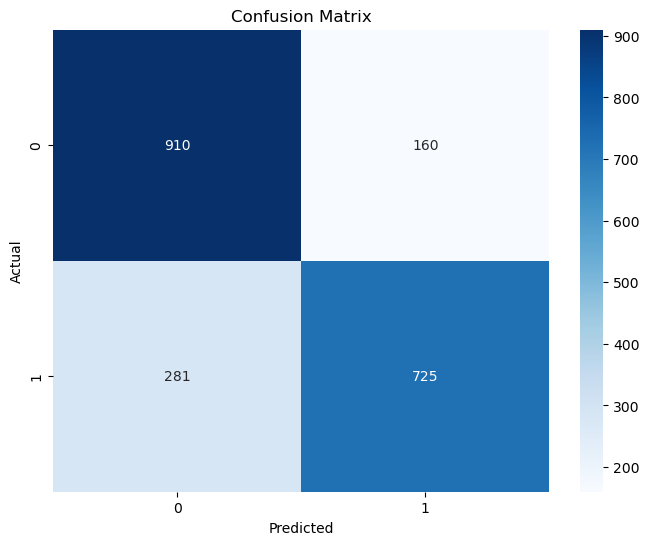

In [81]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
y_pred = grid_search.best_estimator_.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

**Save Model**

In [82]:
joblib.dump(grid_search.best_estimator_,"Rainfall_rain_tommorow.obj")

['Rainfall_rain_tommorow.obj']

# 2.Prediction of Rainfall

In [84]:
df1=pd.read_csv('clean_data.csv')
df1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,3,13.4,22.9,0.6,4.2,3.8,4.0,44.0,5.0,3.0,...,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0,12,1
1,3,7.4,25.1,0.0,8.0,9.9,2.0,44.0,0.0,6.0,...,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0,12,2
2,3,12.9,25.7,0.0,2.0,5.8,5.0,46.0,5.0,6.0,...,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0,12,3
3,3,9.2,28.0,0.0,2.8,10.1,11.0,24.0,13.0,14.0,...,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0,12,4
4,3,17.5,32.3,1.0,1.2,9.5,4.0,41.0,12.0,0.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,12,2.8,23.4,0.0,7.6,9.9,15.0,31.0,13.0,13.0,...,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0,6,21
6758,12,3.6,25.3,0.0,9.4,12.1,0.0,22.0,13.0,2.0,...,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0,6,22
6759,12,5.4,26.9,0.0,2.4,6.7,3.0,37.0,13.0,3.0,...,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0,6,23
6760,12,7.8,27.0,0.0,4.0,0.0,12.0,28.0,11.0,2.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0,6,24


**Checking Correlation with Target Column**

In [85]:
#correlation with target column
correlation_with_quality = new_df.corr()['Rainfall'].abs().sort_values(ascending=False)
print(correlation_with_quality)

Rainfall         1.000000
RainToday        0.973921
Humidity9am      0.418713
Humidity3pm      0.404028
RainTomorrow     0.342188
Cloud9am         0.275602
Temp3pm          0.252031
Cloud3pm         0.243716
MaxTemp          0.241276
Sunshine         0.185309
Pressure9am      0.117454
Temp9am          0.098691
WindGustSpeed    0.085765
Evaporation      0.082976
MinTemp          0.078959
WindDir9am       0.065949
WindGustDir      0.045857
Pressure3pm      0.042510
WindSpeed9am     0.026424
WindSpeed3pm     0.011743
Date_month       0.010149
WindDir3pm       0.009110
Location         0.007119
Date_day         0.005818
Name: Rainfall, dtype: float64


<Axes: >

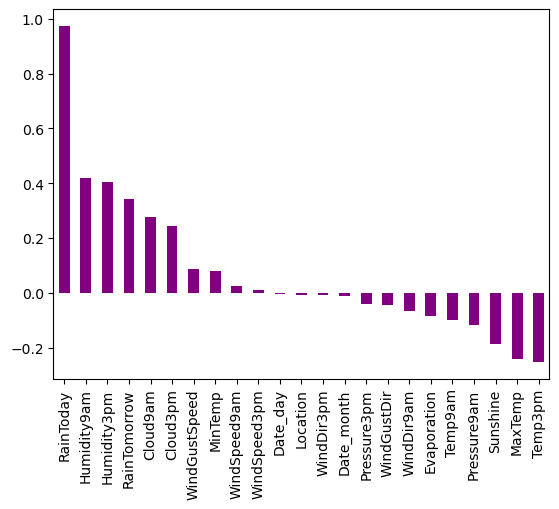

In [86]:
new_df.corr()['Rainfall'].drop(['Rainfall']).sort_values(ascending=False).plot(kind='bar', color='purple')


In [87]:
# dropping irrelevant columns

new_df.drop(columns = ['Date_day','Location','WindDir3pm'],axis=1,inplace=True)


**Splitting into Feature and Target column**

In [88]:
x= new_df.drop('Rainfall', axis=1)
y=new_df['Rainfall']

**Standardization**

In [89]:
sc=StandardScaler()

x=sc.fit_transform(x)

# Model Training


**Find best Randomstate**

In [90]:
maxaccu=0
maxRS=0

for i in range(0,100):
    X_train,X_test,Y_train,Y_test= train_test_split(x,y,random_state=i,test_size=.33)
    LR= LinearRegression()
    LR.fit(X_train,Y_train)
    pred= LR.predict(X_test)
    acc=r2_score(Y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)

Best accuracy is  0.9586443144361407 on Random State = 63


In [91]:
X_train,X_test,Y_train,Y_test= train_test_split(x,y,test_size=.33,random_state=maxRS)


**Defining All Regression Models**

In [92]:
# Create instances of regression models
LR_model = LinearRegression()
RFR_model = RandomForestRegressor()
GB_model = GradientBoostingRegressor()
ADA_model = AdaBoostRegressor()
Bag_model = BaggingRegressor()
DT_model = DecisionTreeRegressor()
KNR_model = KNeighborsRegressor()

# Create a list of regression models
model = [LR_model, RFR_model, GB_model, ADA_model, Bag_model, DT_model, KNR_model]

**Model training**

In [93]:
for reg_model in model:
    reg_model.fit(X_train, Y_train)
    train_pred = reg_model.predict(X_train)
    test_pred = reg_model.predict(X_test)
    
    # R-squared (Coefficient of Determination)
    r2_train = r2_score(Y_train, train_pred)
    r2_test = r2_score(Y_test, test_pred)
    
    # Mean Squared Error (MSE)
    mse_train = mean_squared_error(Y_train, train_pred)
    mse_test = mean_squared_error(Y_test, test_pred)
    
    # Mean Absolute Error (MAE)
    mae_train = mean_absolute_error(Y_train, train_pred)
    mae_test = mean_absolute_error(Y_test, test_pred)
    
    print('Model:', reg_model)
    print('R-squared (Train):', r2_train)
    print('R-squared (Test):', r2_test)
    print('Mean Squared Error (MSE) - Train:', mse_train)
    print('Mean Squared Error (MSE) - Test:', mse_test)
    print('Mean Absolute Error (MAE) - Train:', mae_train)
    print('Mean Absolute Error (MAE) - Test:', mae_test)
    print('--' * 30)

Model: LinearRegression()
R-squared (Train): 0.9484741686450682
R-squared (Test): 0.9586443144361407
Mean Squared Error (MSE) - Train: 0.032885182708189076
Mean Squared Error (MSE) - Test: 0.02821483525588631
Mean Absolute Error (MAE) - Train: 0.10707340730601787
Mean Absolute Error (MAE) - Test: 0.09877400784483828
------------------------------------------------------------
Model: RandomForestRegressor()
R-squared (Train): 0.9923083606352899
R-squared (Test): 0.9556539791044687
Mean Squared Error (MSE) - Train: 0.004909012803532017
Mean Squared Error (MSE) - Test: 0.03025498566308243
Mean Absolute Error (MAE) - Train: 0.04022781456953645
Mean Absolute Error (MAE) - Test: 0.10197670250896057
------------------------------------------------------------
Model: GradientBoostingRegressor()
R-squared (Train): 0.9582065104055774
R-squared (Test): 0.9578409300908988
Mean Squared Error (MSE) - Train: 0.02667373830143619
Mean Squared Error (MSE) - Test: 0.028762942647629578
Mean Absolute Error

**CrossValidation**

In [95]:
for reg_model in model:
    reg_model.fit(X_train, Y_train)
    r2_test = r2_score(Y_test, reg_model.predict(X_test))
    
    cv_r2 = cross_val_score(reg_model, x, y, cv=5, scoring='r2').mean()
    
    print('Model:', reg_model)
    print('R-squared (Test):', r2_test)
    print(f'Cross-validation R-squared:', cv_r2)
    print('--' * 50)

Model: LinearRegression()
R-squared (Test): 0.9586443144361407
Cross-validation R-squared: 0.9513187074606086
----------------------------------------------------------------------------------------------------
Model: RandomForestRegressor()
R-squared (Test): 0.9553548310246258
Cross-validation R-squared: 0.947228265356053
----------------------------------------------------------------------------------------------------
Model: GradientBoostingRegressor()
R-squared (Test): 0.9578159806708203
Cross-validation R-squared: 0.9501618604337315
----------------------------------------------------------------------------------------------------
Model: AdaBoostRegressor()
R-squared (Test): 0.9455058748347065
Cross-validation R-squared: 0.9406746874277718
----------------------------------------------------------------------------------------------------
Model: BaggingRegressor()
R-squared (Test): 0.9514003888691848
Cross-validation R-squared: 0.9423842452354687
--------------------------------

# Linear Regression is best model for Rainfall prediction

**Hyperparameter tuning on Linear regression**

In [96]:
param_grid = {
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'copy_X': [True, False]
}


param_grid

{'fit_intercept': [True, False],
 'normalize': [True, False],
 'copy_X': [True, False]}

In [100]:
#Saving the Model

joblib.dump(LR_model,'Rainfall.obj')

['Rainfall.obj']